**Introduction à l'imagerie numérique**

---

Projet : Interpolation de textures

Noms : Calvin GALAGAIN

In [ ]:
#@title Montage du drive (obligatoire pour l'exécution)
%%capture
from google.colab import drive
drive.mount('/content/drive/')

from math import sqrt
import numpy as np
import cv2
import matplotlib.pyplot as plt
import time

from PIL import Image
import torch
import torchvision
import torchvision.transforms as transforms

from tqdm import tqdm
import random

In [ ]:
#@title ADaIN & TextureMixer importation

# !git clone https://github.com/ningyu1991/TextureMixer.git
# !git clone https://github.com/machrisaa/tensorflow-vgg.git
# !cp -r /content/TextureMixer/* /content/drive/MyDrive/TextureMixer3
# !cp -r /content/tensorflow-vgg/* /content/drive/MyDrive/TextureMixer3

!git clone https://github.com/tyui592/AdaIN_Pytorch.git
!cp -r /content/AdaIN_Pytorch/* /content/


# !cp -r /content/drive/MyDrive/TextureMixer3/* /content/

# on installe python3.6
!apt-get install python3.6

# on change les alternatives
!sudo update-alternatives --install /usr/bin/python3 python3 /usr/bin/python3.6 1

# il faut choisir python3.6
!sudo update-alternatives --config python3

In [ ]:
#@title Installation de Python3.6

# on installe pip pour python3.6
!apt-get install python3-pip
!sudo apt install python3.6-distutils

# on met à jour pip
!python -m pip install --upgrade pip --user
!python3.6 -m pip install -r /content/drive/MyDrive/TextureMixer2/requirements.txt

# on peut vérifier que tout est bon
!python3.6 -m pip list |grep tensorflow
!python3.6 -V

from network import Style_Transfer_Network
from utils import imload, imshow, maskload

# 0. Introduction

L'interpolation de textures, couramment utilisée dans les applications de graphisme, peut reposer sur :
- des méthodes non-paramétriques (basées sur des patchs)
- des méthodes paramétriques (synthèse par réseau de neurones)

Le temps nécessaire pour appliquer les méthodes non-paramétriques et le développement des réseaux de neurones favorise ces derniers, et l'article [Texture Mixer: A Network for Controllable Synthesis and Interpolation of Texture](https://arxiv.org/pdf/1901.03447.pdf) présente une méthode qui implémente un entraînement simultané d'interpolation et de reconstruction, où l'utilisation d'encodage permet une interpolation linéaire avant une projection du domaine latent vers l'image finale. 

Un [Github](https://github.com/ningyu1991/TextureMixer) datant de 2019 montre les techniques utilisées et permet d'afficher diverses applications (dissolve, brush, interpolation) via des modèles pré-entraînés. 

Dans une première approche du sujet, après s'être familiarisé avec les différentes applications, nous nous sommes intéressés en particulier à la fonction de brush, celle-ci étant moins comparée avec des méthodes déjà connues dans l'état de l'art. 

L'étude et l'expérimentation couvrent la génération du fond de texture ainsi que le dessin des caractères choisis ( ici "M V A 1" )
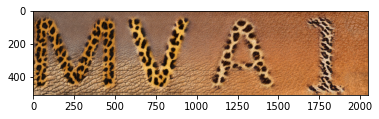

- La durée de génération de cette vidéo, dont l'image finale est affichée ici est de 4h30 (CPU time)

Toutefois, le ré-entrainement pour modifier les fonctions de pertes n'étant pas possible pour contraintes matérielles et d'ancienneté des librairies, nous proposons une comparaison de méthodes suggérées dans l'article sur la précision d'insertion de caractères (brush) sur un fond interpolé. Les méthodes principalement utilisées pour comparaison sont : 

> $α$-blending (pour une baseline de transition pixellaire)

> Inpaint

> AdaIN (transfert de style)

Nous avons choisi d'expérimenter une façon d'implémenter notre propre "brush" par l'affichage des lettres sur un fond, ce qui peut amener à mélanger **8 textures** au total (4 pour chaque coin du fond, et une par caractère), et comparer les méthodes ci-dessus avec celle produite par TextureMixer, notamment au niveau des jonctions de fondu des lettres. 

# 1. Brush

Dans cette première partie, nous allons découvrir les différentes méthodes qui existent. Pour cette partie, nous allons utiliser **2 textures** différentes du reste du problème pour avoir de nouveaux résultats. 

Notre but est ici de tester notre application de brush en interpolant notre lettre d'une texture vers une autre texture.

On sauvegardera pour chaque modèle le coin en haut à droite de la lettre M dans <u>*save_all_fig*</u> pour comparer sur une zone restreinte et évaluer les détails.




In [ ]:
#@title Fonction pour les comparaisons

save_all_fig = []
zoom = 1.2/3

def affichage_compare(save_all_fig):
  fig, axes = plt.subplots(nrows=2, ncols=len(save_all_fig), figsize=(len(save_all_fig)*3, 2*3))
  fig.suptitle("Comparaison des méthodes de Brush :")
  for ncol, dic_save in enumerate(save_all_fig):
    img = dic_save["img"]
    name = dic_save["name"]
    img_all = cv2.rectangle(img.copy(), (len(img)-int(len(img)*zoom), 0), (len(img), int(len(img)*zoom)), (255,0,0), int(len(img)*zoom/40))
    if len(save_all_fig) == 1:
      axes[0].imshow(img_all)
      axes[0].axis("off")
      axes[0].set_title(name)
    else:
      axes[0][ncol].imshow(img_all)
      axes[0][ncol].axis("off")
      axes[0][ncol].set_title(name)

    if len(save_all_fig) == 1:
      axes[1].imshow(img[:int(len(img)*zoom), -int(len(img)*zoom):])
      axes[1].axis("off")
      axes[1].set_title(name)
    else:
      axes[1][ncol].imshow(img[:int(len(img)*zoom), -int(len(img)*zoom):])
      axes[1][ncol].axis("off")
      axes[1][ncol].set_title(name)
  plt.show()

## 1.1 Support de comparaison

La première méthode va permettre de point de comparaison pour les autres. On "découpe" notre lettre de la première texture que l'on colle sur la deuxième texture.

> Les contours sont ici très nets.

> Il n'y a pas de transitions.

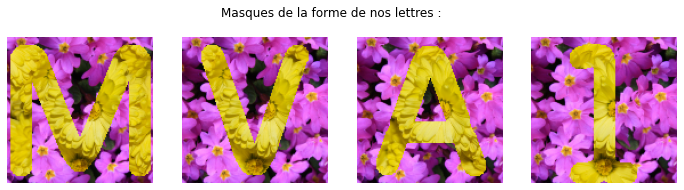

In [ ]:
#@title Masque de base

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(12, 3))
fig.suptitle("Masques de la forme de nos lettres :")
ncol = 0

for letter in ["M", "V", "A", "1"]:
  img1 = cv2.imread("/content/drive/MyDrive/TextureMixer3/examples/plant_texture/1000_F_14272823_UvUFYoezSUv1sGFHECVH3pJbXdsO5W9Q_NW_aug00000023.png")
  img2 = cv2.imread("/content/drive/MyDrive/TextureMixer3/examples/plant_texture/1000_F_10342053_hlSQbtTruUXCrfm1ylQWCt0E9iH9Hquo_NW_aug00000005.png")
  img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
  img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
  img3 = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_"+letter+"_10.png")
  img4 = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_inv_"+letter+"_10.png")


  base = ((img1)*(img3/255).astype(int)+(img2)*(img4/255).astype(int)).astype(np.uint8)
  axes[ncol].imshow(base)
  axes[ncol].axis("off")
  if letter == "M":
    save_all_fig.append({"img":base, "name": "simple_masque"})
  ncol+=1
plt.show()

## 1.2 Première méthode

Le Mélange Naïf par Alpha est une méthode qui est assimilée à un passage progressif d'une matière à une autre. En effet, pour comprendre le concept, donnons deux nombres A et B et nous allons chercher à créer C de taille fixée qui cherche à passer de A à B progressivement.

For $\alpha$  in range(len(C)) $=>$ $C[\alpha] = \alpha * A + (1-\alpha) * B$

La taille de C va donc être notre précision d'interpolation, plus cette valeur est grande plus on va vouloir créer de valeurs intermédiaires entre A et B.

Maintenant que l'on a compris le principe en 1 dimension, il est possible de généraliser en plus grande dimension. En effet, pour des images, plusieurs possibilités s'offrent à nous.

> Pour une **interpolation**, on duplique crée deux matrices temporaires C1 et C2. C1 va être un maillage de A sur tous ces pixels, c'est à dire que chaque patch de C1 est égal à A. C2 est construit de même avec B. Enfin, on peut créer notre image résultat C de la même façon. Nous verrons ce résultat entre 4 images plus tard dans ce travail.

> Pour notre **brush**, on part de noyau de notre lettre. Celui-ci est comme un masque binaire. Pour chaque pixel, on regarde on regarde la distance par rapport au pixel du masque le plus proche, et, il nous reste plus qu'à multiplier plus ou moins par l'image de fond ou de peinture. On se retrouve presque dans notre cas à une dimension.

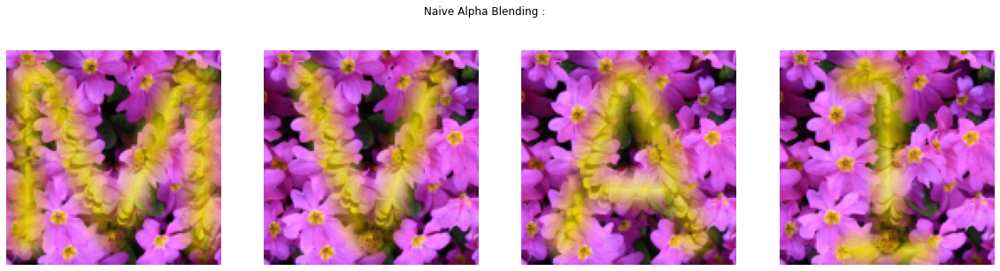

affichage et calcul en : 20.3034405708313


In [ ]:
#@title naive_alpha_blending

def naive_alpha_blending(source, target, mask, interpol_size):
  coords = []

  for i in range(len(mask)):
    for j in range(len(mask[0])):
      if mask[i][j].sum() != 0:
        coords.append([i, j])

  rows, cols, channels = mask.shape

  result = np.zeros((rows, cols, 3), np.float32)

  for i in range(len(mask)):
    for j in range(len(mask[0])):
      alpha = min(min([sqrt((i-coord[0])**2+(j-coord[1])**2)for coord in coords]), interpol_size)
      
      alpha /= interpol_size
      result[i][j] = source[i][j]*(1-alpha)+target[i][j]*alpha
  return result.astype(np.uint8)


t_start = time.time()
img1 = cv2.imread("/content/drive/MyDrive/TextureMixer3/examples/plant_texture/1000_F_10342053_hlSQbtTruUXCrfm1ylQWCt0E9iH9Hquo_NW_aug00000005.png")
img2 = cv2.imread("/content/drive/MyDrive/TextureMixer3/examples/plant_texture/1000_F_14272823_UvUFYoezSUv1sGFHECVH3pJbXdsO5W9Q_NW_aug00000023.png")

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

letter_M = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/M_skeleton.png")
letter_V = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/V_skeleton.png")
letter_A = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/A_skeleton.png")
letter_1 = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/1_skeleton.png")

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
fig.suptitle("Naive Alpha Blending :")
letters = [letter_M, letter_V, letter_A, letter_1]

for ncol in range(4):
  axes[ncol].imshow(naive_alpha_blending(img1, img2, letters[ncol], 15))
  axes[ncol].axis("off")

  if ncol == 0:
    save_all_fig.append({"img":naive_alpha_blending(img1, img2, letters[ncol], 15), "name": "naive_alpha_blending"})
plt.show()

print("affichage et calcul en :", time.time()-t_start)

Ici les résultats de cette méthode sont très intéressants. La première chose à noter est que la méthode s'éxecute relativement rapidement, sans entraînement. 

> En moins de 20 secondes on a une interpolation progressive.

> Le passage d'une texture à une autre est progressif mais, ne modifie pas les formes d'origine.

Malgré les 20 secondes, le résultat est long car, notre méthode parcourt tous les pixels de l'image puis, elle calcule la distance de chaque point du masque de la lettre. On a ici une complexité proche de $O(N^4)$.

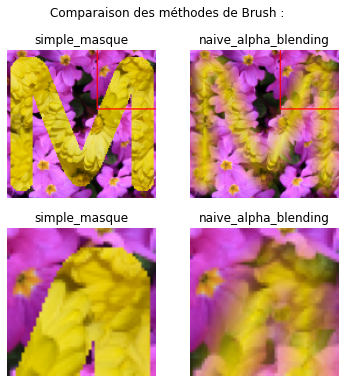

In [ ]:
#@title comparaison des résultats

affichage_compare(save_all_fig)

## 1.3 Découverte de l'Inpainting

L'inpainting est une technique qui permet de restaurer les images endommagées ou dégradées en remplaçant les zones affectées par les pixels environnants. Cette technique est très utile lorsque nous avons des photos anciennes avec des taches noires, des traits etc. qui ne peuvent pas être simplement effacées avec un outil de peinture car cela remplacerait simplement les structures noires par des structures blanches, ce qui n'a aucun intérêt. OpenCV fournit deux algorithmes pour l'inpainting, qui peuvent tous deux être accessibles à l'aide de la fonction cv.inpaint(). 

- Le premier algorithme est basé sur l'article <u>"An Image Inpainting Technique Based on the Fast Marching Method"</u> d'Alexandru Telea en 2004 et est basé sur la méthode Fast Marching. L'algorithme commence par la limite de la région à réparer et remplit progressivement tout ce qui se trouve à la limite en premier. Il prend une petite zone autour du pixel à réparer et le remplace par la somme pondérée normalisée de tous les pixels connus dans la zone. La sélection des poids est importante et les pixels proches du point à réparer, proches de la normale de la limite et ceux situés sur les contours de la limite sont donnés plus de poids. Une fois qu'un pixel a été réparé, l'algorithme passe au pixel suivant le plus proche en utilisant la méthode Fast Marching. Ce algorithme peut être activé en utilisant le drapeau *cv.INPAINT_TELEA*.

- Le deuxième algorithme est basé sur l'article <u>"Navier-Stokes, Fluid Dynamics, et Image et Vidéo Inpainting"</u> de Bertalmio, Marcelo, Andrea L. Bertozzi et Guillermo Sapiro en 2001. Il est basé sur la dynamique des fluides et utilise des équations différentielles partielles. La principale stratégie est heuristique et l'algorithme parcourt d'abord les bords des régions connues aux régions inconnues (car les bords sont censés être continus). Il continue les isophotes (lignes reliant des points ayant la même intensité) tout en correspondant aux vecteurs de gradient à la frontière de la région à réparer. Pour ce faire, certaines méthodes de la dynamique des fluides sont utilisées. Une fois qu'ils sont obtenus, la couleur est remplie pour réduire la variance minimale dans cette zone. Cet algorithme peut être activé en utilisant le drapeau *cv.INPAINT_NS*.

Pour utiliser cette méthode, nous allons créer une zone masquée de 8 pixels qui passe d'une texture à une autre comme nous le verrons. Nous allons comparer pour plusieurs valeurs de "inpaintRadius"	représentant le rayon de voisinage circulaire de chaque point peint considéré par l'algorithme. 

In [ ]:
#@title Creation des masques pour les lettres

letter_M = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/M_skeleton.png")
letter_V = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/V_skeleton.png")
letter_A = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/A_skeleton.png")
letter_1 = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/1_skeleton.png")

letters = [letter_M, letter_V, letter_A, letter_1]

def masked(mask, interpol_size):
  coords = []

  for i in range(len(mask)):
    for j in range(len(mask[0])):
      if mask[i][j].sum() != 0:
        coords.append([i, j])

  rows, cols, channels = mask.shape

  result = np.zeros((rows, cols, 3), np.float32)

  for i in range(len(mask)):
    for j in range(len(mask[0])):
      alpha = min(min([sqrt((i-coord[0])**2+(j-coord[1])**2)for coord in coords]), interpol_size)
      
      alpha /= interpol_size
      result[i][j] = np.array([int(alpha), int(alpha), int(alpha)])
  return result*255

# for size in range(1, 20):
#   size = str(size)
#   print(size)
#   cv2.imwrite("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_M_"+size+".png", masked(letters[0], int(size)))
#   cv2.imwrite("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_V_"+size+".png", masked(letters[1], int(size)))
#   cv2.imwrite("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_A_"+size+".png", masked(letters[2], int(size)))
#   cv2.imwrite("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_1_"+size+".png", masked(letters[3], int(size)))

#   cv2.imwrite("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_inv_M_"+size+".png", 255-masked(letters[0], int(size)))
#   cv2.imwrite("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_inv_V_"+size+".png", 255-masked(letters[1], int(size)))
#   cv2.imwrite("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_inv_A_"+size+".png", 255-masked(letters[2], int(size)))
#   cv2.imwrite("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_inv_1_"+size+".png", 255-masked(letters[3], int(size)))
print("done")

done


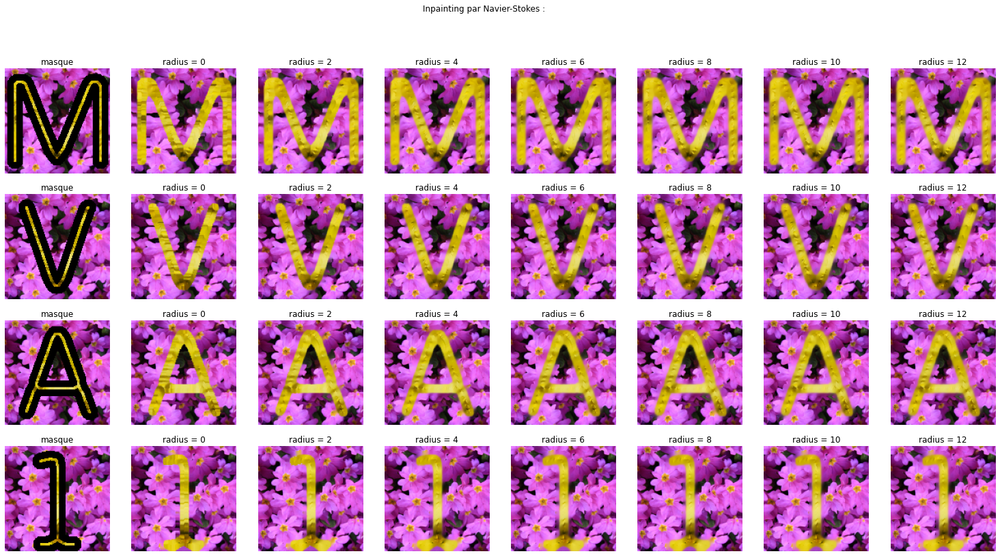

affichage et calcul en : 3.5287599563598633


In [ ]:
#@title INPAINT_NS
t_start = time.time()
fig, axes = plt.subplots(nrows=4, ncols=8, figsize=(26, 13))
fig.suptitle("Inpainting par Navier-Stokes :")
ncol = 0

for letter in ["M", "V", "A", "1"]:
  img1 = cv2.imread("/content/drive/MyDrive/TextureMixer3/examples/plant_texture/1000_F_14272823_UvUFYoezSUv1sGFHECVH3pJbXdsO5W9Q_NW_aug00000023.png")
  img2 = cv2.imread("/content/drive/MyDrive/TextureMixer3/examples/plant_texture/1000_F_10342053_hlSQbtTruUXCrfm1ylQWCt0E9iH9Hquo_NW_aug00000005.png")
  img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
  img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
  img3 = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_"+letter+"_10.png")
  img4 = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_inv_"+letter+"_2.png")


  base = ((img1)*(img3/255).astype(int)+(img2)*(img4/255).astype(int)).astype(np.uint8)
  axes[ncol][0].imshow(base)
  axes[ncol][0].axis("off")
  axes[ncol][0].set_title("masque")

  for i in range(1, 8):
    mask = 255-(img3+img4)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY).astype(np.uint8)
    dst = cv2.inpaint(base, mask, (i-1)*2, cv2.INPAINT_NS)
    axes[ncol][i].imshow(dst)
    axes[ncol][i].axis("off")
    axes[ncol][i].set_title("radius = "+str((i-1)*2))
    if letter == "M" and (i-1)*2==6:
      save_all_fig.append({"img":dst, "name": "INPAINT_NS / radius=6"})
  ncol+=1
plt.show()
print("affichage et calcul en :", time.time()-t_start)

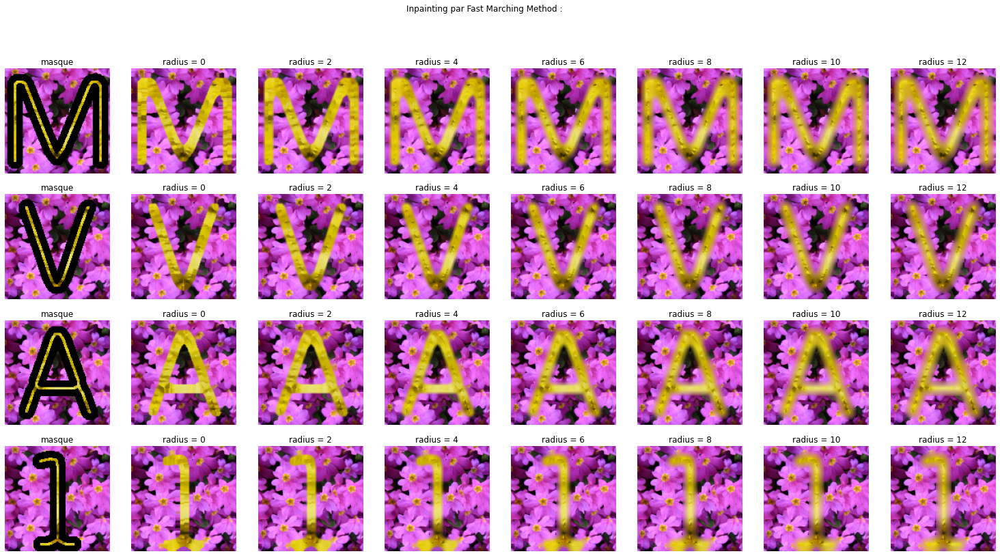

affichage et calcul en : 3.6618950366973877


In [ ]:
#@title INPAINT_TELEA

t_start = time.time()
fig, axes = plt.subplots(nrows=4, ncols=8, figsize=(26, 13))
fig.suptitle("Inpainting par Fast Marching Method :")
ncol = 0

for letter in ["M", "V", "A", "1"]:
  img1 = cv2.imread("/content/drive/MyDrive/TextureMixer3/examples/plant_texture/1000_F_14272823_UvUFYoezSUv1sGFHECVH3pJbXdsO5W9Q_NW_aug00000023.png")
  img2 = cv2.imread("/content/drive/MyDrive/TextureMixer3/examples/plant_texture/1000_F_10342053_hlSQbtTruUXCrfm1ylQWCt0E9iH9Hquo_NW_aug00000005.png")
  img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
  img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
  img3 = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_"+letter+"_10.png")
  img4 = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_inv_"+letter+"_2.png")


  base = ((img1)*(img3/255).astype(int)+(img2)*(img4/255).astype(int)).astype(np.uint8)
  axes[ncol][0].imshow(base)
  axes[ncol][0].axis("off")
  axes[ncol][0].set_title("masque")

  for i in range(1, 8):
    mask = 255-(img3+img4)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY).astype(np.uint8)
    dst = cv2.inpaint(base, mask, (i-1)*2, cv2.INPAINT_TELEA)
    axes[ncol][i].imshow(dst)
    axes[ncol][i].axis("off")
    axes[ncol][i].set_title("radius = "+str((i-1)*2))
    if letter == "M" and (i-1)*2==6:
      save_all_fig.append({"img":dst, "name": "INPAINT_TELEA / radius=6"})
  ncol+=1
plt.show()
print("affichage et calcul en :", time.time()-t_start)

Les deux méthodes ont donc des résultats différents même si les contours sont très nets. On passe brutalement d'une texture à une autre avec deux visions différentes.

> La méthode par Navier-Stroke cherche à conserver les formes.

> La Fast Matching méthode cherche à être progressive est à faire le passage avec un flou où l'on ne voit pas grand chose. 

> Par rapport à la première méthode, nous avons diviser notre temps de calcul par 6.

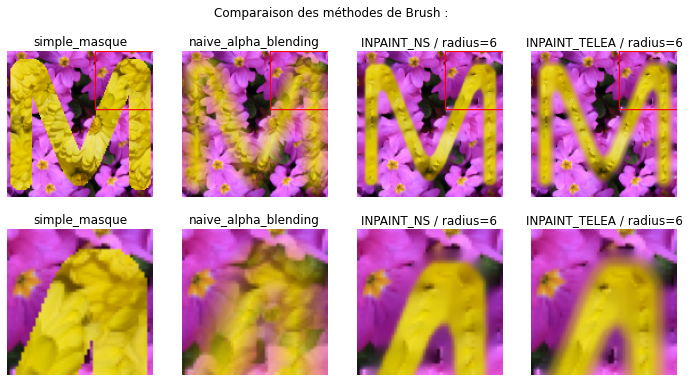

In [ ]:
#@title comparaison des résultats

affichage_compare(save_all_fig)

## 1.4 Méthode par réseaux de neurones

Le papier <u>"Arbitrary Style Transfer in Real-time with Adaptive Instance Normalization"</u> utilise des réseaux de neurones pour réaliser le transfert de style d'une image.

Le transfert de style est un processus qui consiste à appliquer le style visuel d'une image source, appelée "style image", à une image cible, appelée "content image", pour produire une image stylisée.

La méthode présentée dans ce papier utilise des réseaux de neurones pour apprendre la relation entre les styles et les contenus, et pour générer l'image stylisée en temps réel. Cette méthode utilise une normalisation d'instance adaptative pour gérer les différences d'échelle entre les différents styles, ce qui lui permet de traiter des styles arbitraires.

En ce qui concerne la méthode de stylisation d'image avec plusieurs styles et masques, elle consiste à utiliser plusieurs styles différents et masques pour styliser différentes parties de l'image cible. Cela permet de produire des images stylisées avec des styles différents pour différentes parties de l'image. Les masques sont utilisés pour déterminer les régions de l'image qui doivent être stylisées avec un style particulier. Les réseaux de neurones sont également utilisés pour apprendre à combiner les styles de manière cohérente et pour produire des images stylisées avec plusieurs styles et masques.

### Intérêt de l'introduction des réseaux de neurones

Les réseaux de neurones et les méthodes basées sur les patchs sont deux approches différentes pour la restauration d'images.

- Les réseaux de neurones sont des algorithmes formés sur de grandes quantités de données d'entraînement pour comprendre les tâches qui nécessitent une reconnaissance de forme ou une compréhension de la structure des données. Dans le cas de la restauration d'images, les réseaux de neurones peuvent être formés pour compléter ou restaurer des parties manquantes ou endommagées de l'image.

- Les méthodes basées sur les patchs, telles que cv2.inpaint ou le fondu alpha naïf, sont des méthodes plus simples qui examinent les pixels individuels et leur voisinage pour déterminer comment les remplir. Cependant, elles peuvent ne pas être aussi efficaces que les réseaux de neurones pour les tâches de restauration d'image complexes, car elles n'ont pas la capacité de comprendre la structure globale de l'image.

En résumé, les réseaux de neurones peuvent fournir des résultats plus précis et plus naturels pour la restauration d'images en raison de leur capacité à comprendre la structure globale des données, tandis que les méthodes basées sur les patchs sont plus simples et plus rapides mais peuvent ne pas donner les mêmes résultats.

In [ ]:
#@title Importation des poids
%%capture

check_point = torch.load("/content/drive/MyDrive/TextureMixer3/TextureModels/check_point.pth")

device = torch.device('cuda')
transfer_network = Style_Transfer_Network()
transfer_network.load_state_dict(check_point['state_dict'])

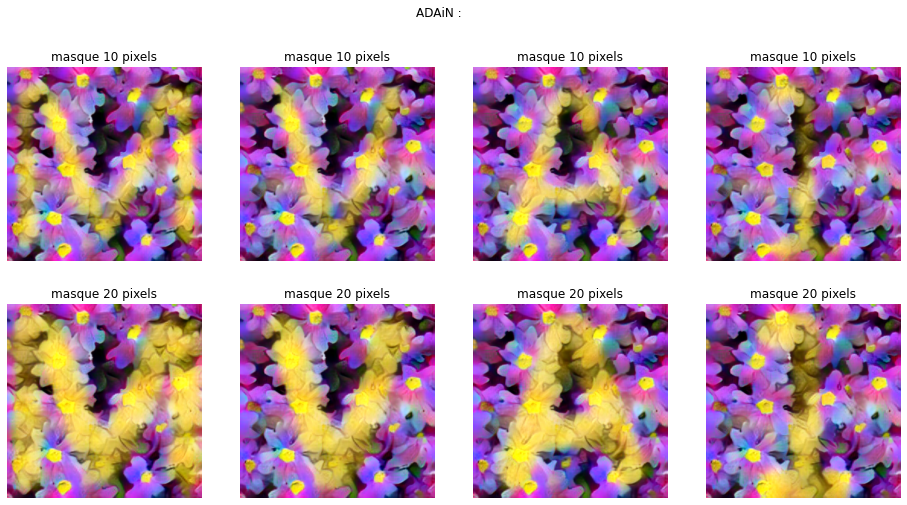

affichage et calcul en : 88.38190412521362


In [ ]:
#@title ADaIN
t_start = time.time()

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 8))
fig.suptitle("ADAiN :")

content = "/content/drive/MyDrive/TextureMixer3/examples/plant_texture/1000_F_14272823_UvUFYoezSUv1sGFHECVH3pJbXdsO5W9Q_NW_aug00000023.png"
styles = ["/content/drive/MyDrive/TextureMixer3/examples/plant_texture/1000_F_14272823_UvUFYoezSUv1sGFHECVH3pJbXdsO5W9Q_NW_aug00000023.png", 
          "/content/drive/MyDrive/TextureMixer3/examples/plant_texture/1000_F_10342053_hlSQbtTruUXCrfm1ylQWCt0E9iH9Hquo_NW_aug00000005.png"]
    
for mask in range(2):
  i = mask
  mask = (mask+1)*10
  ncol = 0
  for letter in ["M", "V", "A", "1"]:
    masks = ["/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_"+letter+"_"+str(int(mask/2))+".png", 
             "/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_inv_"+letter+"_"+str(int(mask/2))+".png"]

    style_strength = 1.0
    interpolation_weights=[1.0, 1.0]
    content_img = imload(content, imsize=512)
    style_imgs = [imload(style, imsize=512, cropsize=512, cencrop=True) for style in styles]
    mask_imgs = [maskload(mask) for mask in masks]
    with torch.no_grad():
        stylized_img = transfer_network(content_img, style_imgs, style_strength, interpolation_weights, mask_imgs)
    
    axes[i][ncol].imshow(np.array(imshow(stylized_img)))
    axes[i][ncol].axis("off")
    axes[i][ncol].set_title("masque "+str(mask)+" pixels")

    if letter == "M":
      save_all_fig.append({"img":np.array(imshow(stylized_img)), "name": "AdaIN_"+str(mask)})
    ncol+=1
plt.show()
print("affichage et calcul en :", time.time()-t_start)

Les résultats que l'on obtient possèdent des avantages et des inconvénients.

> Les résultats que l'on obtient ici changent la forme des lettres au niveau des contours. Et ceci est d'autant plus vrai quand le masque s'agrandit. On observe que les transitions pour le ADaIN_20 proposent des courbes qui possèdent une logique et un changement des couleurs qui minimise la perte.

> Ici, on utilise un masquage des lettres et, on transfert les styles à travers ceux-ci. On remarque que les images sont différentes et notamment notre image de fond. On remarque que les couleurs sont différentes car le réseau à chercher à créer une texture qui correspond le mieu au problème.

> On met une quarantaine de secondes pour former nos 4 lettres. Ce qui confirme que cette implémentation est beaucoup plus longue.

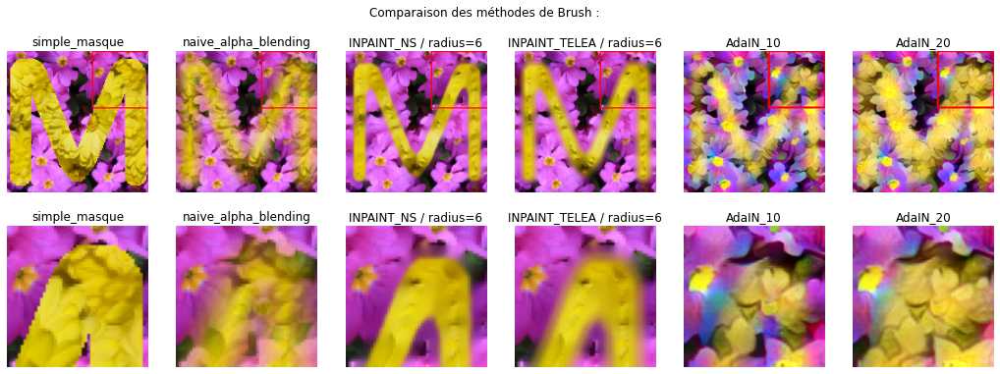

In [ ]:
#@title comparaison des résultats

affichage_compare(save_all_fig)

## 1.5 Conclusion

Maintenant que l'on connait mieux les différentes méthodes qui existent, la comparaison avec les méthodes de TextureMixer est possible. Nous allons discuter des choix à faire et des différentes étapes qu'ils ont utilisé pour arriver à leur résultat.

# 2. Interpolation & Brush

## 2.1 Textures que nous allons utiliser

In [ ]:
#@title création des textures

imageBgUL_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_23745067_w0GkcAIQG2C4hxOelI1aQYZglEXggGRS_NW_aug00000000.png"
imageBgUR_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_44327602_E6wl8FNihQON8c704fE5DEY2LOJPQQ1V_NW_aug00000018.png"
imageBgBL_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_66218716_rxcsXWQzYpIWVB8a09ZcuNzE7qAJ3HEk_NW_aug00000098.png"
imageBgBR_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_40846588_APKTS3BpiRvR1nvUx0FRa7qjjR788zt8_NW_aug00000001.png"

imageFgUL_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_40300952_3dgaCtcLCrhzU0r6HEfnwr7nujDWXbSQ_NW_aug00000029.png"
imageFgUR_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_44119648_3vskjRwVc4NVT1Pf0l3RlvIFUemo8TM1_NW_aug00000001.png"
imageFgBL_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_70708482_2N8lknTCJg2Q8JQeomFYaFttxId9rulj_NW_aug00000070.png"
imageFgBR_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_79496236_8mxTSHy5OilHnJaAxWcw2dwC9SoBLmDK_NW_aug00000057.png"

imageBgUL = cv2.imread(imageBgUL_path)
imageBgUR = cv2.imread(imageBgUR_path)
imageBgBL = cv2.imread(imageBgBL_path)
imageBgBR = cv2.imread(imageBgBR_path)

imageBgUL = cv2.cvtColor(imageBgUL, cv2.COLOR_BGR2RGB)
imageBgUR = cv2.cvtColor(imageBgUR, cv2.COLOR_BGR2RGB)
imageBgBL = cv2.cvtColor(imageBgBL, cv2.COLOR_BGR2RGB)
imageBgBR = cv2.cvtColor(imageBgBR, cv2.COLOR_BGR2RGB)

imageFgUL = cv2.imread(imageFgUL_path)
imageFgUR = cv2.imread(imageFgUR_path)
imageFgBL = cv2.imread(imageFgBL_path)
imageFgBR = cv2.imread(imageFgBR_path)

imageFgUL = cv2.cvtColor(imageFgUL, cv2.COLOR_BGR2RGB)
imageFgUR = cv2.cvtColor(imageFgUR, cv2.COLOR_BGR2RGB)
imageFgBL = cv2.cvtColor(imageFgBL, cv2.COLOR_BGR2RGB)
imageFgBR = cv2.cvtColor(imageFgBR, cv2.COLOR_BGR2RGB)

letter_M = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/M_skeleton.png")
letter_V = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/V_skeleton.png")
letter_A = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/A_skeleton.png")
letter_1 = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/1_skeleton.png")

## 2.2 Interpolation du fond par Naive Alpha Blending

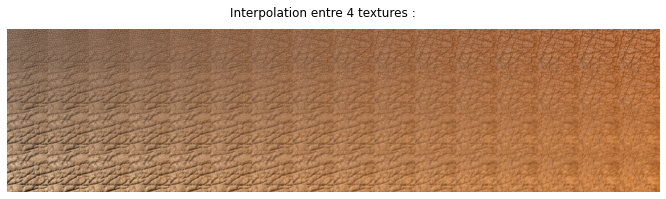

affichage et calcul en : 0.5442368984222412


In [ ]:
#@title le fond à peindre
t_start = time.time()
outputBgUL = np.zeros((512, 2048, 3), np.uint8)
for i in range(16):
  for j in range(4):
    outputBgUL[128*j:128*(j+1), 128*i:128*(i+1)] = imageBgUL

outputBgUR = np.zeros((512, 2048, 3), np.uint8)
for i in range(16):
  for j in range(4):
    outputBgUR[128*j:128*(j+1), 128*i:128*(i+1)] = imageBgUR

outputBgBL = np.zeros((512, 2048, 3), np.uint8)
for i in range(16):
  for j in range(4):
    outputBgBL[128*j:128*(j+1), 128*i:128*(i+1)] = imageBgBL

outputBgBR = np.zeros((512, 2048, 3), np.uint8)
for i in range(16):
  for j in range(4):
    outputBgBR[128*j:128*(j+1), 128*i:128*(i+1)] = imageBgBR

output = np.zeros((512, 2048, 3), np.uint8)

nb_patch = 100
for i in range(nb_patch):
  for j in range(nb_patch):

    start_i = int(output.shape[1]/nb_patch  * i)
    end_i = int(output.shape[1]/nb_patch  * (i + 1))
    
    start_j = int(output.shape[0]/nb_patch  * j)
    end_j = int(output.shape[0]/nb_patch  * (j + 1))

    alpha_i = i / (nb_patch-1)
    alpha_j = j / (nb_patch-1)
    output[start_j:end_j, start_i:end_i] = outputBgUL[start_j:end_j, start_i:end_i]*(1-alpha_i)*(1-alpha_j) \
                                         + outputBgBR[start_j:end_j, start_i:end_i]*(alpha_i)*(alpha_j) \
                                         + outputBgUR[start_j:end_j, start_i:end_i]*(alpha_i)*(1-alpha_j) \
                                         + outputBgBL[start_j:end_j, start_i:end_i]*(1-alpha_i)*(alpha_j)
fig = plt.figure(figsize=(12, 3))
fig.suptitle("Interpolation entre 4 textures :")
plt.axis("off")
plt.imshow(output)
plt.show()
print("affichage et calcul en :", time.time()-t_start)

fond_a_peindre = output.copy()
save_results = []

## 2.3 Masque de base

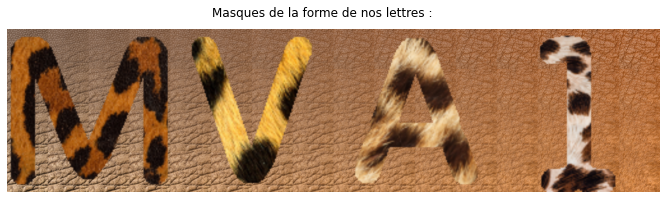

affichage et calcul en : 0.2981259822845459


In [ ]:
#@title Masque de base
t_start = time.time()

interpol_style = [imageFgUL, imageFgUR, imageFgBL, imageFgBR]
output = fond_a_peindre.copy()

for i, letter in enumerate(["M", "V", "A", "1"]):
  img1 = output[:, i*512:(i+1)*512]
  img2 = cv2.resize(interpol_style[i], (512, 512))

  mask = cv2.resize(cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_"+letter+"_10.png"), (512, 512))
  output[:, i*512:(i+1)*512] = img1*(mask/255) + img2 *((255-mask)/255) 

fig = plt.figure(figsize=(12, 3))
fig.suptitle("Masques de la forme de nos lettres :")
plt.axis("off")
plt.imshow(output)
plt.show()
print("affichage et calcul en :", time.time()-t_start)

save_results.append({"img": output, "name":"simple_masque"})

## 2.4 Naive Alpha Blending

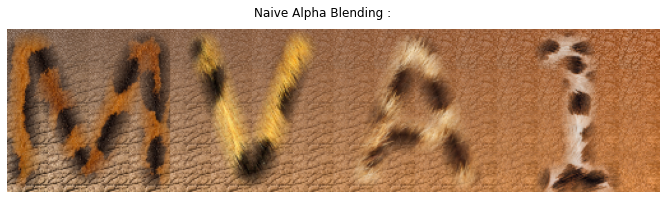

affichage et calcul en : 14.293509483337402


In [ ]:
#@title naive_alpha_blending
t_start = time.time()
output = cv2.resize(fond_a_peindre.copy(), (128*4, 128))

letters = [letter_M, letter_V, letter_A, letter_1]

for i in range(4):
  img1 = output[:, 128*i:128*(i+1)]
  img2 = cv2.resize(interpol_style[i], (128, 128))

  output[:, 128*i:128*(i+1)] = naive_alpha_blending(img2, img1, letters[i], 15)

fig = plt.figure(figsize=(12, 3))
fig.suptitle("Naive Alpha Blending :")
plt.axis("off")
plt.imshow(output)
plt.show()
print("affichage et calcul en :", time.time()-t_start)

save_results.append({"img": output, "name":"naive_alpha_blending"})

## 2.5 Inpainting

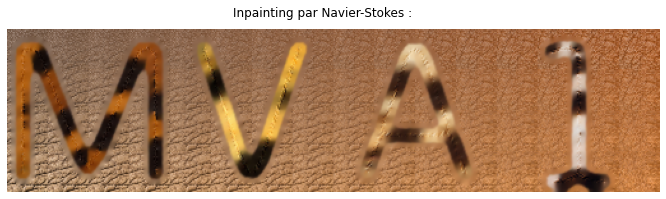

affichage et calcul en : 0.26064491271972656


In [ ]:
#@title INPAINT_NS
t_start = time.time()

output = cv2.resize(fond_a_peindre.copy(), (128*4, 128))

for i, letter in enumerate(["M", "V", "A", "1"]):
  img1 = output[:, 128*i:128*(i+1)]
  img2 = cv2.resize(interpol_style[i], (128, 128))
  img3 = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_"+letter+"_10.png")
  img4 = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_inv_"+letter+"_2.png")


  base = ((img1)*(img3/255).astype(int)+(img2)*(img4/255).astype(int)).astype(np.uint8)

  mask = 255-(img3+img4)
  mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY).astype(np.uint8)
  output[:, 128*i:128*(i+1)] = cv2.inpaint(base, mask, 6, cv2.INPAINT_NS)

fig = plt.figure(figsize=(12, 3))
fig.suptitle("Inpainting par Navier-Stokes :")
plt.axis("off")
plt.imshow(output)
plt.show()
print("affichage et calcul en :", time.time()-t_start)

save_results.append({"img": output, "name":"INPAINT_NS / radius=6"})

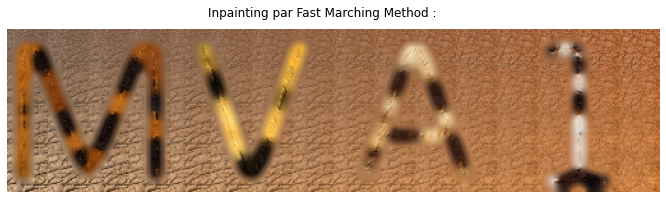

affichage et calcul en : 0.22831511497497559


In [ ]:
#@title INPAINT_TELEA
t_start = time.time()

output = cv2.resize(fond_a_peindre.copy(), (128*4, 128))

for i, letter in enumerate(["M", "V", "A", "1"]):
  img1 = output[:, 128*i:128*(i+1)]
  img2 = cv2.resize(interpol_style[i], (128, 128))
  img3 = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_"+letter+"_10.png")
  img4 = cv2.imread("/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_inv_"+letter+"_2.png")


  base = ((img1)*(img3/255).astype(int)+(img2)*(img4/255).astype(int)).astype(np.uint8)

  mask = 255-(img3+img4)
  mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY).astype(np.uint8)
  output[:, 128*i:128*(i+1)] = cv2.inpaint(base, mask, 6, cv2.INPAINT_TELEA)

fig = plt.figure(figsize=(12, 3))
fig.suptitle("Inpainting par Fast Marching Method :")
plt.axis("off")
plt.imshow(output)
plt.show()
print("affichage et calcul en :", time.time()-t_start)

save_results.append({"img": output, "name":"INPAINT_TELEA / radius=6"})

## 2.6 ADaIN

In [ ]:
#@title fonctions pour ADaIN
def _normalizer(denormalize=False):
    MEAN = [0.485, 0.456, 0.406]
    STD = [0.229, 0.224, 0.225]    
    
    if denormalize:
        MEAN = [-mean/std for mean, std in zip(MEAN, STD)]
        STD = [1/std for std in STD]
    
    return transforms.Normalize(mean=MEAN, std=STD)

def _transformer(imsize=None, cropsize=None, cencrop=False):
    transformer = []
    if imsize:
        transformer.append(transforms.Resize(imsize))
    if cropsize:
        if cencrop:
            transformer.append(transforms.CenterCrop(cropsize))
        else:
            transformer.append(transforms.RandomCrop(cropsize))
            
    transformer.append(transforms.ToTensor())
    transformer.append(_normalizer())
    return transforms.Compose(transformer)

def imload2(path, imsize=None, cropsize=None, cencrop=False):
    transformer = _transformer(imsize=imsize, cropsize=cropsize, cencrop=cencrop)
    return transformer(Image.fromarray(path).convert("RGB")).unsqueeze(0)

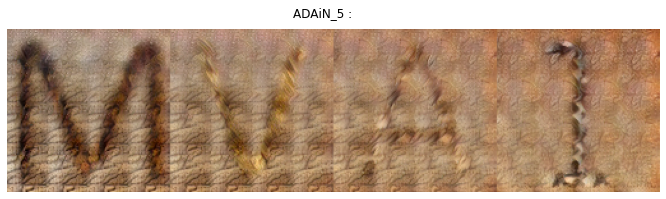

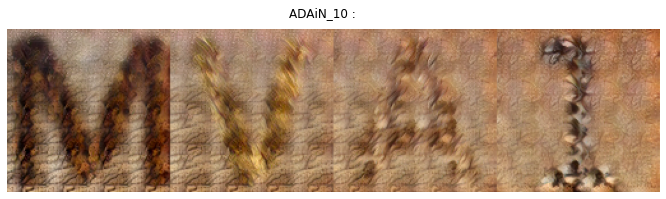

affichage et calcul en : 84.86155366897583


In [ ]:
#@title ADaIN
t_start = time.time()
    
for mask in range(2):
  output = cv2.resize(fond_a_peindre.copy(), (128*4, 128))
  mask = (mask+1)*10
  ncol = 0
  for i, letter in enumerate(["M", "V", "A", "1"]):

    content = output[:, 128*i:128*(i+1)]
    styles = [output[:, 128*i:128*(i+1)], 
              cv2.resize(interpol_style[i], (128, 128))]
    masks = ["/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_"+letter+"_"+str(int(mask/2))+".png", 
             "/content/drive/MyDrive/TextureMixer3/stroke_fig/mask_inv_"+letter+"_"+str(int(mask/2))+".png"]

    style_strength = 1.0
    interpolation_weights=[1.0, 1.0]
    content_img = imload2(content, imsize=512)
    style_imgs = [imload2(style, imsize=512, cropsize=512, cencrop=True) for style in styles]
    mask_imgs = [maskload(mask) for mask in masks]
    with torch.no_grad():
        stylized_img = transfer_network(content_img, style_imgs, style_strength, interpolation_weights, mask_imgs)
    
    output[:, 128*i:128*(i+1)] = cv2.resize(np.array(imshow(stylized_img)), (128, 128))
  fig = plt.figure(figsize=(12, 3))
  fig.suptitle("ADAiN"+"_"+str(int(mask/2))+ " :")
  plt.imshow(output)
  plt.axis("off")
  plt.show()
  
  save_results.append({"img": output, "name":"ADAiN"+"_"+str(int(mask))})
print("affichage et calcul en :", time.time()-t_start)

## 2.7 Comparaisons avec l'article TextureMixer

In [ ]:
#@title Texture Mixer
result_paper = np.load("/content/drive/MyDrive/TextureMixer3/results/animal_texture/brush/brush.npy")
save_results.append({"img": result_paper[-1], "name":"TextureMixer"})

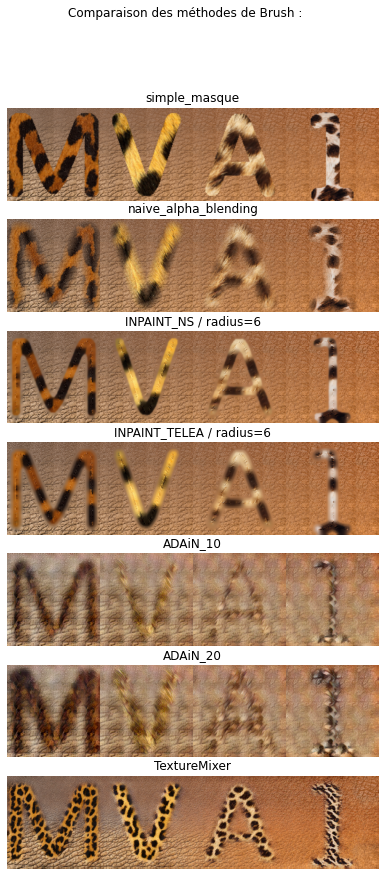

In [ ]:
#@title Comparaisons
fig, axes = plt.subplots(nrows=len(save_results), ncols=1, figsize=(8, len(save_results)*2))

fig.suptitle("Comparaison des méthodes de Brush :")
for ncol, dic_save in enumerate(save_results):
  img = dic_save["img"]
  name = dic_save["name"]
  axes[ncol].imshow(img)
  axes[ncol].axis("off")
  axes[ncol].set_title(name)

plt.show()

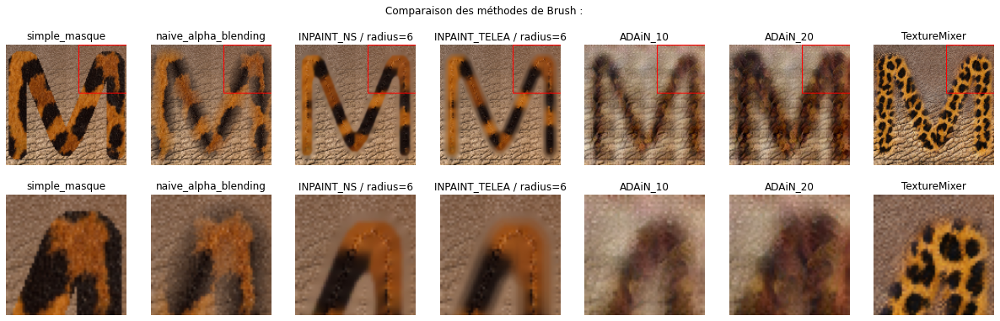

In [ ]:
#@title Fonction pour les comparaisons - zoom sur bord du 1er caractère

save_all_fig = []
zoom = 1.2/3

fig, axes = plt.subplots(nrows=2, ncols=len(save_results), figsize=(len(save_results)*3, 2*3))
fig.suptitle("Comparaison des méthodes de Brush :")
for ncol, dic_save in enumerate(save_results):
  img = dic_save["img"]
  name = dic_save["name"]
  if img.shape[0]==128:
    img = cv2.resize(img[:128, :128], (128, 128))
  else:
    img = cv2.resize(img[:512, :512], (128, 128))
  img_all = cv2.rectangle(img.copy(), (len(img)-int(len(img)*zoom), 0), (len(img), int(len(img)*zoom)), (255,0,0), int(len(img)*zoom/40))
  axes[0][ncol].imshow(img_all)
  axes[0][ncol].axis("off")
  axes[0][ncol].set_title(name)

  axes[1][ncol].imshow(img[:int(len(img)*zoom), -int(len(img)*zoom):])
  axes[1][ncol].axis("off")
  axes[1][ncol].set_title(name)
plt.show()

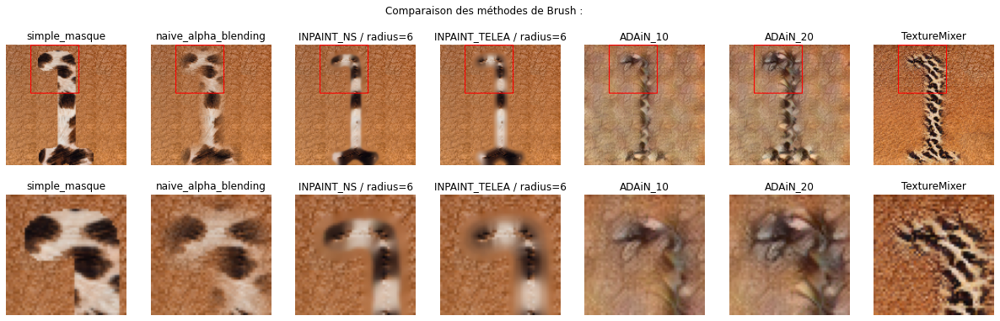

In [ ]:
#@title Fonction pour les comparaisons - zoom dernier caractère

save_all_fig = []
zoom = 1.2/3

fig, axes = plt.subplots(nrows=2, ncols=len(save_results), figsize=(len(save_results)*3, 2*3))
fig.suptitle("Comparaison des méthodes de Brush :")
for ncol, dic_save in enumerate(save_results):
  img = dic_save["img"]
  name = dic_save["name"]
  if img.shape[0]==128:
    img = cv2.resize(img[:, -128:], (128, 128))
  else:
    img = cv2.resize(img[:, -512:], (128, 128))
  img_all = cv2.rectangle(img.copy(), (len(img)-2*int(len(img)*zoom), 0), (len(img)-int(len(img)*zoom), int(len(img)*zoom)), (255,0,0), int(len(img)*zoom/40))
  axes[0][ncol].imshow(img_all)
  axes[0][ncol].axis("off")
  axes[0][ncol].set_title(name)

  axes[1][ncol].imshow(img[:int(len(img)*zoom), len(img)-2*int(len(img)*zoom):len(img)-int(len(img)*zoom)])
  axes[1][ncol].axis("off")
  axes[1][ncol].set_title(name)
plt.show()

Les méthodes illustrées dans cette partie sont la suite logique de nos premières explorations.

- Les méthodes par réseaux de neuronnes permettent de générer des nouvelles textures et des nouvelles parties de l'image. Néanmoins, elles sont beaucoup plus lentes.

La méthode de Naive Alpha Blending est parmi les meilleures en partant du postulat que celle-ci est très rapide et que le résultat final est proche du papier original.
On notera que notre image est moins nette, il faudrait renforcer la valeur d'alpha en faveur de notre brush au coutour des lettres.

# 3. Expérimentations

Nous allons récupérer l'implémentation de la fonction texture_brush_vidéo pour comprendre étape par étape ce qu'il se passe.

Nous allons ainsi pouvoir comparer les résultats qu'ils obtiennent avec les notres.

## 3.1 Mise en marche du Github

In [ ]:
#@title partie 1

imageBgUL_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_23745067_w0GkcAIQG2C4hxOelI1aQYZglEXggGRS_NW_aug00000000.png"
imageBgUR_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_44327602_E6wl8FNihQON8c704fE5DEY2LOJPQQ1V_NW_aug00000018.png"
imageBgBL_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_66218716_rxcsXWQzYpIWVB8a09ZcuNzE7qAJ3HEk_NW_aug00000098.png"
imageBgBR_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_40846588_APKTS3BpiRvR1nvUx0FRa7qjjR788zt8_NW_aug00000001.png"
imageFgUL_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_40300952_3dgaCtcLCrhzU0r6HEfnwr7nujDWXbSQ_NW_aug00000029.png"
imageFgUR_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_44119648_3vskjRwVc4NVT1Pf0l3RlvIFUemo8TM1_NW_aug00000001.png"
imageFgBL_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_70708482_2N8lknTCJg2Q8JQeomFYaFttxId9rulj_NW_aug00000070.png"
imageFgBR_path = "/content/drive/MyDrive/TextureMixer3/examples/animal_texture/1000_F_79496236_8mxTSHy5OilHnJaAxWcw2dwC9SoBLmDK_NW_aug00000057.png"
stroke1_path = "/content/drive/MyDrive/TextureMixer3/stroke_fig/M_skeleton.png"
stroke2_path = "/content/drive/MyDrive/TextureMixer3/stroke_fig/V_skeleton.png"
stroke3_path = "/content/drive/MyDrive/TextureMixer3/stroke_fig/A_skeleton.png"
stroke4_path = "/content/drive/MyDrive/TextureMixer3/stroke_fig/1_skeleton.png"
scale_h_bg = 4
scale_w_bg = 16
scale_h_fg = 8
scale_w_fg = 8
stroke_radius_div = 128.0 
minibatch_size = 1
mp4_fps = 60
mp4_codec = 'libx265'
mp4_bitrate = '16M'

In [ ]:
#@title partie 2

E_zg_output_shapes = [[None, 128, 1, 1], [None, 128, 1, 1]]
E_zl_output_shapes = [[None, 128, 32, 32], [None, 128, 32, 32]]
G_output_shapes = [[None, 3, 128, 128]] 
D_rec_output_shapes = [[None, 1, 1, 1]]
D_interp_output_shapes = [[None, 1, 1, 1]] 
D_blend_output_shapes = [[None, 1, 1, 1]]
Es_zg_output_shapes = [[None, 128, 1, 1], [None, 128, 1, 1]] 
Es_zl_output_shapes = [[None, 128, 32, 32], [None, 128, 32, 32]] 
Gs_output_shapes = [[None, 3, 128, 128]] 
Gs_fcn_bg_output_shapes = [[None, 3, 512, 2048]] 
Gs_fcn_fg_output_shapes = [[None, 3, 1024, 1024]]

E_zg_input_shapes = [[None, 3, 128, 128]]
E_zl_input_shapes = [[None, 3, 128, 128]]
G_input_shapes = [[None, 128, 32, 32], [None, 128, 32, 32]]
D_rec_input_shapes = [[None, 3, 128, 128]]
D_interp_input_shapes = [[None, 3, 128, 128]]
D_blend_input_shapes = [[None, 3, 128, 128]]
Es_zg_input_shapes = [[None, 3, 128, 128]]
Es_zl_input_shapes = [[None, 3, 128, 128]]
Gs_input_shapes = [[None, 128, 32, 32], [None, 128, 32, 32]]
Gs_fcn_bg_input_shapes = [[None, 128, 128, 512], [None, 128, 128, 512]]
Gs_fcn_fg_input_shapes = [[None, 128, 256, 256], [None, 128, 256, 256]]

config_block_size = 0
config_perm = False

Gs_fcn_bg_input_shape = [None, 128, 128, 512]
Gs_fcn_fg_input_shape = [None, 128, 256, 256]

In [ ]:
#@title partie 3

def adjust_dynamic_range(data, drange_in, drange_out):
    if drange_in != drange_out:
        scale = (np.float32(drange_out[1]) - np.float32(drange_out[0])) / (np.float32(drange_in[1]) - np.float32(drange_in[0]))
        bias = (np.float32(drange_out[0]) - np.float32(drange_in[0]) * scale)
        data = data * scale + bias
    return data

def my_swap_w(mat0):
    # top down scanning
    mat = np.array(mat0)
    if mat.shape[1] > 1:
        for j in range(mat.shape[1]):
            p = np.random.uniform()
            if j == 0:
                if p < 0.5:
                    temp = np.array(mat[:,j]); mat[:,j] = np.array(mat[:,j+1]); mat[:,j+1] = np.array(temp)
            elif j == mat.shape[1]-1:
                if p < 0.5:
                    temp = np.array(mat[:,j]); mat[:,j] = np.array(mat[:,j-1]); mat[:,j-1] = np.array(temp)
            else:
                if p < 1.0/3.0:
                    temp = np.array(mat[:,j]); mat[:,j] = np.array(mat[:,j+1]); mat[:,j+1] = np.array(temp)
                elif p > 2.0/3.0:
                    temp = np.array(mat[:,j]); mat[:,j] = np.array(mat[:,j-1]); mat[:,j-1] = np.array(temp)
        # bottom up scanning
        for j in range(mat.shape[1])[::-1]:
            p = np.random.uniform()
            if j == 0:
                if p < 0.5:
                    temp = np.array(mat[:,j]); mat[:,j] = np.array(mat[:,j+1]); mat[:,j+1] = np.array(temp)
            elif j == mat.shape[1]-1:
                if p < 0.5:
                    temp = np.array(mat[:,j]); mat[:,j] = np.array(mat[:,j-1]); mat[:,j-1] = np.array(temp)
            else:
                if p < 1.0/3.0:
                    temp = np.array(mat[:,j]); mat[:,j] = np.array(mat[:,j+1]); mat[:,j+1] = np.array(temp)
                elif p > 2.0/3.0:
                    temp = np.array(mat[:,j]); mat[:,j] = np.array(mat[:,j-1]); mat[:,j-1] = np.array(temp)
    return mat


def block_permutation(perm, block_size):
    mat = np.zeros((perm.shape[0]*block_size, perm.shape[1]*block_size))
    for i in range(perm.shape[0]):
        for j in range(perm.shape[1]):
            if perm[i,j] == 1.0:
                mat[i*block_size:(i+1)*block_size, j*block_size:(j+1)*block_size] = np.eye(block_size)
    return mat


def permutation_matrix_w_sampler(scale_w):
    temp_perm = np.eye(Es_zl_output_shapes[0][3]*scale_w)
    for idx in range(int(np.log(Es_zl_output_shapes[0][3]))):
        block_size_temp = int(2**idx)
        perm = my_swap_w(np.eye(Es_zl_output_shapes[0][3]*scale_w//block_size_temp))
        cur_perm = block_permutation(perm, block_size_temp)
        if scale_w == 8:
            im = cur_perm.astype(np.uint8) * 255
            im = np.dstack((im, im, im))
        temp_perm = np.matmul(cur_perm, temp_perm)
    if scale_w == 8:
        im = temp_perm.astype(np.uint8) * 255
        im = np.dstack((im, im, im))
    permutation_matrix_w = np.tile(temp_perm, [1, Es_zl_output_shapes[0][1],1,1])
    return permutation_matrix_w


def my_swap_h(mat0):
    # top down scanning
    mat = np.array(mat0)
    if mat.shape[0] > 1:
        for i in range(mat.shape[0]):
            p = np.random.uniform()
            if i == 0:
                if p < 0.5:
                    temp = np.array(mat[i,:]); mat[i,:] = np.array(mat[i+1,:]); mat[i+1,:] = np.array(temp)
            elif i == mat.shape[0]-1:
                if p < 0.5:
                    temp = np.array(mat[i,:]); mat[i,:] = np.array(mat[i-1,:]); mat[i-1,:] = np.array(temp)
            else:
                if p < 1.0/3.0:
                    temp = np.array(mat[i,:]); mat[i,:] = np.array(mat[i+1,:]); mat[i+1,:] = np.array(temp)
                elif p > 2.0/3.0:
                    temp = np.array(mat[i,:]); mat[i,:] = np.array(mat[i-1,:]); mat[i-1,:] = np.array(temp)
        # bottom up scanning
        for i in range(mat.shape[0])[::-1]:
            p = np.random.uniform()
            if i == 0:
                if p < 0.5:
                    temp = np.array(mat[i,:]); mat[i,:] = np.array(mat[i+1,:]); mat[i+1,:] = np.array(temp)
            elif i == mat.shape[0]-1:
                if p < 0.5:
                    temp = np.array(mat[i,:]); mat[i,:] = np.array(mat[i-1,:]); mat[i-1,:] = np.array(temp)
            else:
                if p < 1.0/3.0:
                    temp = np.array(mat[i,:]); mat[i,:] = np.array(mat[i+1,:]); mat[i+1,:] = np.array(temp)
                elif p > 2.0/3.0:
                    temp = np.array(mat[i,:]); mat[i,:] = np.array(mat[i-1,:]); mat[i-1,:] = np.array(temp)
    return mat


def permutation_matrix_h_sampler(scale_h):
    temp_perm = np.eye(Es_zl_output_shapes[0][2]*scale_h)
    for idx in range(int(np.log(Es_zl_output_shapes[0][2]))):
        block_size_temp = int(2**idx)
        perm = my_swap_h(np.eye(Es_zl_output_shapes[0][2]*scale_h//block_size_temp))
        cur_perm = block_permutation(perm, block_size_temp)
        if scale_h == 8:
            im = cur_perm.astype(np.uint8) * 255
            im = np.dstack((im, im, im))
        temp_perm = np.matmul(temp_perm, cur_perm)
    if scale_h == 8:
        im = temp_perm.astype(np.uint8) * 255
        im = np.dstack((im, im, im))
    permutation_matrix_h = np.tile(temp_perm, [1, Es_zl_output_shapes[0][1],1,1])
    return permutation_matrix_h

def create_image_grid(images, grid_size=None):
    assert images.ndim == 3 or images.ndim == 4
    num, img_w, img_h = images.shape[0], images.shape[-1], images.shape[-2]

    if grid_size is not None:
        grid_w, grid_h = tuple(grid_size)
    else:
        grid_w = max(int(np.ceil(np.sqrt(num))), 1)
        grid_h = max((num - 1) // grid_w + 1, 1)

    grid = np.zeros(list(images.shape[1:-2]) + [grid_h * img_h, grid_w * img_w], dtype=images.dtype)
    for idx in range(num):
        x = (idx % grid_w) * img_w
        y = (idx // grid_w) * img_h
        grid[..., y : y + img_h, x : x + img_w] = images[idx]
    return grid

def gkern_for_weight_arbitrary_shape(out_h, out_w , x, y, sig_div):
    cx = float(x)
    cy = float(y)
    sig = float(out_w) / sig_div
    ax = np.arange(0.0, float(out_w))
    ay = np.arange(0.0, float(out_h))
    xx, yy = np.meshgrid(ax, ay)
    #kernel = np.exp(-((xx-cx)**2 + (yy-cy)**2) / (2. * sig**2))
    kernel = np.exp(-(np.maximum(np.absolute(xx-cx)-sig, 0.0)**2 + (yy-cy)**2) / (2. * sig**2))
    kernel = (kernel - np.amin(kernel)) / (np.amax(kernel) - np.amin(kernel))
    return kernel

def im2graph(im):
    h = im.shape[0]; w = im.shape[1]
    graph = np.zeros((h*w, h*w)).astype(np.uint8)
    y, x = np.where(im>0)
    for i in range(len(y)):
        y0 = y[i]; x0 = x[i]
        idx0 = y0 + x0 * h
        for dx in [-1, 0, 1]:
            for dy in [-1, 0, 1]:
                if abs(dy) + abs(dx) > 0:
                    if im[y0+dy, x0+dx] > 0:
                        idx1 = (y0+dy) + (x0+dx) * h
                        graph[idx0, idx1] = 1
                        graph[idx1, idx0] = 1
    return graph

def im2trajectory(im):
    h = im.shape[0]; w = im.shape[1]
    graph = im2graph(im)
    cur_idx = None
    trajectory = []
    while np.sum(graph) > 0:
        if cur_idx is None:
            degree = np.sum(graph, axis=1)
            idx_valid = np.where(degree>0)[0]
            degree_valid = degree[idx_valid]
            idx_min = np.argmin(degree_valid)
            cur_idx = idx_valid[idx_min]
        else:
            cur_y = cur_idx % h
            cur_x = cur_idx // h
            trajectory.append([cur_y, cur_x])
            if np.sum(graph[cur_idx,:]) == 0:
                cur_idx = None
            else:
                next_idx = np.where(graph[cur_idx,:]>0)[0][0]
                graph[cur_idx, next_idx] = 0
                graph[next_idx, cur_idx] = 0
                cur_idx = next_idx
    if cur_idx is not None:
        cur_y = cur_idx % h
        cur_x = cur_idx // h
        trajectory.append([cur_y, cur_x])
    return trajectory

def linkern_for_weight_arbitrary_shape(out_h, out_w, latent_res):
    kernel_h = np.reshape(np.linspace(start=0.0, stop=1.0, num=out_h-2*latent_res)[::-1], [out_h-2*latent_res,1])
    kernel_h = np.concatenate((np.ones((latent_res,1)), kernel_h, np.zeros((latent_res,1))), axis=0)
    kernel_h = np.tile(kernel_h, [1,out_w])
    kernel_w = np.reshape(np.linspace(start=0.0, stop=1.0, num=out_w-2*latent_res)[::-1], [1,out_w-2*latent_res])
    kernel_w = np.concatenate((np.ones((1,latent_res)), kernel_w, np.zeros((1,latent_res))), axis=1)
    kernel_w = np.tile(kernel_w, [out_h,1])
    weight_ul = kernel_h * kernel_w
    weight_ur = kernel_h * (1.0 - kernel_w)
    weight_bl = (1.0 - kernel_h) * kernel_w
    weight_br = (1.0 - kernel_h) * (1.0 - kernel_w)
    return weight_ul, weight_ur, weight_bl, weight_br

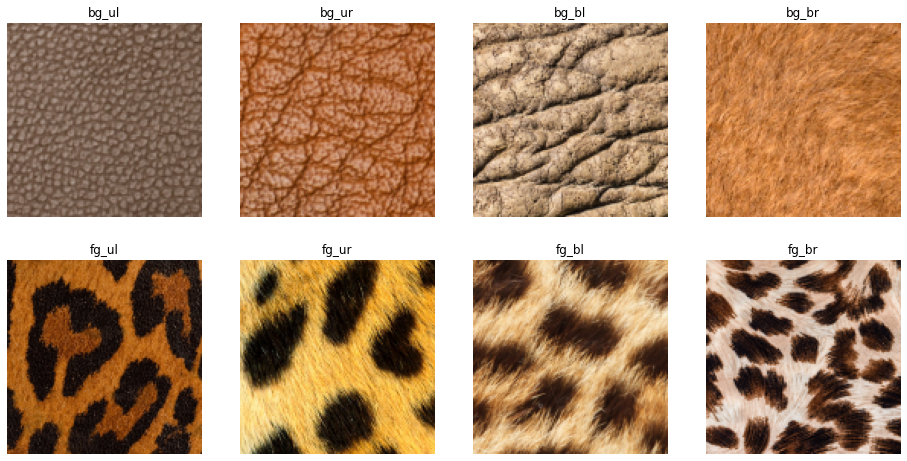

In [ ]:
#@title partie 4

sample_fg_1 = np.array([0, 0, 2*Gs_input_shapes[0][2], 2*Gs_input_shapes[0][3]]) # brush_1 sampling position in the fg palette
sample_fg_2 = np.array([0, 0, 2*Gs_input_shapes[0][2], 6*Gs_input_shapes[0][3]]) # brush_2 sampling position in the fg palette
sample_fg_3 = np.array([0, 0, 6*Gs_input_shapes[0][2], 2*Gs_input_shapes[0][3]]) # brush_3 sampling position in the fg palette
sample_fg_4 = np.array([0, 0, 6*Gs_input_shapes[0][2], 6*Gs_input_shapes[0][3]]) # brush_4 sampling position in the fg palette
bg_ul = np.transpose(adjust_dynamic_range(np.array(Image.open(imageBgUL_path)).astype(np.float32), [0,255], [0,1]), axes=[2,0,1])[np.newaxis,:,:,:]
bg_ur = np.transpose(adjust_dynamic_range(np.array(Image.open(imageBgUR_path)).astype(np.float32), [0,255], [0,1]), axes=[2,0,1])[np.newaxis,:,:,:]
bg_bl = np.transpose(adjust_dynamic_range(np.array(Image.open(imageBgBL_path)).astype(np.float32), [0,255], [0,1]), axes=[2,0,1])[np.newaxis,:,:,:]
bg_br = np.transpose(adjust_dynamic_range(np.array(Image.open(imageBgBR_path)).astype(np.float32), [0,255], [0,1]), axes=[2,0,1])[np.newaxis,:,:,:]
fg_ul = np.transpose(adjust_dynamic_range(np.array(Image.open(imageFgUL_path)).astype(np.float32), [0,255], [0,1]), axes=[2,0,1])[np.newaxis,:,:,:]
fg_ur = np.transpose(adjust_dynamic_range(np.array(Image.open(imageFgUR_path)).astype(np.float32), [0,255], [0,1]), axes=[2,0,1])[np.newaxis,:,:,:]
fg_bl = np.transpose(adjust_dynamic_range(np.array(Image.open(imageFgBL_path)).astype(np.float32), [0,255], [0,1]), axes=[2,0,1])[np.newaxis,:,:,:]
fg_br = np.transpose(adjust_dynamic_range(np.array(Image.open(imageFgBR_path)).astype(np.float32), [0,255], [0,1]), axes=[2,0,1])[np.newaxis,:,:,:]

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 8))

L = [bg_ul, bg_ur, bg_bl, bg_br, fg_ul, fg_ur, fg_bl, fg_br]
L_title = ["bg_ul", "bg_ur", "bg_bl", "bg_br", "fg_ul", "fg_ur", "fg_bl", "fg_br"]

nrow = 0
ncol = 0
for i in range(len(L)):
  axes[nrow][ncol].imshow(L[i][0].transpose(1,2,0))
  axes[nrow][ncol].set_title(L_title[i])
  axes[nrow][ncol].axis("off")
  ncol +=1
  if ncol==4:
    ncol=0
    nrow+=1
plt.show()

In [ ]:
#@title partie 5

print('zg encoding...')

zg_latents_bg_ul = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zg_mu_bg_ul.npy")
zg_latents_bg_ur = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zg_mu_bg_ur.npy")
zg_latents_bg_bl = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zg_mu_bg_bl.npy")
zg_latents_bg_br = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zg_mu_bg_br.npy")
print("zg_latents_bg_ul.shape :", zg_latents_bg_ul.shape)
print("zg_latents_bg_ur.shape :", zg_latents_bg_ur.shape)
print("zg_latents_bg_bl.shape :", zg_latents_bg_bl.shape)
print("zg_latents_bg_br.shape :", zg_latents_bg_br.shape)

zg_latents_fg_ul = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zg_mu_fg_ul.npy")
zg_latents_fg_ur = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zg_mu_fg_ur.npy")
zg_latents_fg_bl = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zg_mu_fg_bl.npy")
zg_latents_fg_br = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zg_mu_fg_br.npy")
print("zg_latents_fg_ul.shape :", zg_latents_fg_ul.shape)
print("zg_latents_fg_ur.shape :", zg_latents_fg_ur.shape)
print("zg_latents_fg_bl.shape :", zg_latents_fg_bl.shape)
print("zg_latents_fg_br.shape :", zg_latents_fg_br.shape)

print('zl encoding...')

zl_latents_bg_ul = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zl_mu_bg_ul.npy")
zl_latents_bg_ur = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zl_mu_bg_ur.npy")
zl_latents_bg_bl = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zl_mu_bg_bl.npy")
zl_latents_bg_br = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zl_mu_bg_br.npy")
print("zl_latents_bg_ul.shape :", zl_latents_bg_ul.shape)
print("zl_latents_bg_ur.shape :", zl_latents_bg_ur.shape)
print("zl_latents_bg_bl.shape :", zl_latents_bg_bl.shape)
print("zl_latents_bg_br.shape :", zl_latents_bg_br.shape)

zl_latents_fg_ul = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zl_mu_fg_ul.npy")
zl_latents_fg_ur = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zl_mu_fg_ur.npy")
zl_latents_fg_bl = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zl_mu_fg_bl.npy")
zl_latents_fg_br = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/zl_mu_fg_br.npy")
print("zl_latents_fg_ul.shape :", zl_latents_fg_ul.shape)
print("zl_latents_fg_ur.shape :", zl_latents_fg_ur.shape)
print("zl_latents_fg_bl.shape :", zl_latents_fg_bl.shape)
print("zl_latents_fg_br.shape :", zl_latents_fg_br.shape)

# compute permutation matrices
permutation_matrix_w_0_bg_ul = permutation_matrix_w_sampler(scale_w_bg)
permutation_matrix_h_0_bg_ul = permutation_matrix_h_sampler(scale_h_bg)
permutation_matrix_w_0_bg_ur = permutation_matrix_w_sampler(scale_w_bg)
permutation_matrix_h_0_bg_ur = permutation_matrix_h_sampler(scale_h_bg)
print("permutation_matrix_w_0_bg_ul.shape :", permutation_matrix_w_0_bg_ul.shape)
print("permutation_matrix_h_0_bg_ul.shape :", permutation_matrix_h_0_bg_ul.shape)
print("permutation_matrix_w_0_bg_ur.shape :", permutation_matrix_w_0_bg_ur.shape)
print("permutation_matrix_h_0_bg_ur.shape :", permutation_matrix_h_0_bg_ur.shape)

permutation_matrix_w_0_bg_bl = permutation_matrix_w_sampler(scale_w_bg)
permutation_matrix_h_0_bg_bl = permutation_matrix_h_sampler(scale_h_bg)
permutation_matrix_w_0_bg_br = permutation_matrix_w_sampler(scale_w_bg)
permutation_matrix_h_0_bg_br = permutation_matrix_h_sampler(scale_h_bg)
print("permutation_matrix_w_0_bg_bl.shape :", permutation_matrix_w_0_bg_bl.shape)
print("permutation_matrix_h_0_bg_bl.shape :", permutation_matrix_h_0_bg_bl.shape)
print("permutation_matrix_w_0_bg_br.shape :", permutation_matrix_w_0_bg_br.shape)
print("permutation_matrix_h_0_bg_br.shape :", permutation_matrix_h_0_bg_br.shape)

permutation_matrix_w_0_fg_ul = permutation_matrix_w_sampler(scale_w_fg)
permutation_matrix_h_0_fg_ul = permutation_matrix_h_sampler(scale_h_fg)
permutation_matrix_w_0_fg_ur = permutation_matrix_w_sampler(scale_w_fg)
permutation_matrix_h_0_fg_ur = permutation_matrix_h_sampler(scale_h_fg)
print("permutation_matrix_w_0_fg_ul.shape :", permutation_matrix_w_0_fg_ul.shape)
print("permutation_matrix_h_0_fg_ul.shape :", permutation_matrix_h_0_fg_ul.shape)
print("permutation_matrix_w_0_fg_ur.shape :", permutation_matrix_w_0_fg_ur.shape)
print("permutation_matrix_h_0_fg_ur.shape :", permutation_matrix_h_0_fg_ur.shape)

permutation_matrix_w_0_fg_bl = permutation_matrix_w_sampler(scale_w_fg)
permutation_matrix_h_0_fg_bl = permutation_matrix_h_sampler(scale_h_fg)
permutation_matrix_w_0_fg_br = permutation_matrix_w_sampler(scale_w_fg)
permutation_matrix_h_0_fg_br = permutation_matrix_h_sampler(scale_h_fg)
print("permutation_matrix_w_0_fg_bl.shape :", permutation_matrix_w_0_fg_bl.shape)
print("permutation_matrix_h_0_fg_bl.shape :", permutation_matrix_h_0_fg_bl.shape)
print("permutation_matrix_w_0_fg_br.shape :", permutation_matrix_w_0_fg_br.shape)
print("permutation_matrix_h_0_fg_br.shape :", permutation_matrix_h_0_fg_br.shape)

# compute alpha blending matt
kernel_weight_bg_ul, kernel_weight_bg_ur, kernel_weight_bg_bl, kernel_weight_bg_br = linkern_for_weight_arbitrary_shape(out_h=Gs_fcn_bg_input_shape[2], out_w=Gs_fcn_bg_input_shape[3], latent_res=Gs_input_shapes[0][2])
kernel_weight_bg_ul = np.tile(kernel_weight_bg_ul[np.newaxis, np.newaxis, :, :], [1, Es_zl_output_shapes[0][1], 1, 1])
kernel_weight_bg_ur = np.tile(kernel_weight_bg_ur[np.newaxis, np.newaxis, :, :], [1, Es_zl_output_shapes[0][1], 1, 1])
kernel_weight_bg_bl = np.tile(kernel_weight_bg_bl[np.newaxis, np.newaxis, :, :], [1, Es_zl_output_shapes[0][1], 1, 1])
kernel_weight_bg_br = np.tile(kernel_weight_bg_br[np.newaxis, np.newaxis, :, :], [1, Es_zl_output_shapes[0][1], 1, 1])
print("kernel_weight_bg_ul.shape :",kernel_weight_bg_ul.shape)
print("kernel_weight_bg_ur.shape :",kernel_weight_bg_ur.shape)
print("kernel_weight_bg_bl.shape :",kernel_weight_bg_bl.shape)
print("kernel_weight_bg_br.shape :", kernel_weight_bg_br.shape)

kernel_weight_fg_ul, kernel_weight_fg_ur, kernel_weight_fg_bl, kernel_weight_fg_br = linkern_for_weight_arbitrary_shape(out_h=Gs_fcn_fg_input_shape[2], out_w=Gs_fcn_fg_input_shape[3], latent_res=Gs_input_shapes[0][2])
kernel_weight_fg_ul = np.tile(kernel_weight_fg_ul[np.newaxis, np.newaxis, :, :], [1, Es_zl_output_shapes[0][1], 1, 1])
kernel_weight_fg_ur = np.tile(kernel_weight_fg_ur[np.newaxis, np.newaxis, :, :], [1, Es_zl_output_shapes[0][1], 1, 1])
kernel_weight_fg_bl = np.tile(kernel_weight_fg_bl[np.newaxis, np.newaxis, :, :], [1, Es_zl_output_shapes[0][1], 1, 1])
kernel_weight_fg_br = np.tile(kernel_weight_fg_br[np.newaxis, np.newaxis, :, :], [1, Es_zl_output_shapes[0][1], 1, 1])
print("kernel_weight_fg_ul.shape :",kernel_weight_fg_ul.shape)
print("kernel_weight_fg_ur.shape :",kernel_weight_fg_ur.shape)
print("kernel_weight_fg_bl.shape :",kernel_weight_fg_bl.shape)
print("kernel_weight_fg_br.shape :", kernel_weight_fg_br.shape)

# interpolate zg
interp_zg_latents_bg_ul = np.tile(zg_latents_bg_ul, [1, 1, Gs_fcn_bg_input_shapes[0][2], Gs_fcn_bg_input_shapes[0][3]])
interp_zg_latents_bg_ur = np.tile(zg_latents_bg_ur, [1, 1, Gs_fcn_bg_input_shapes[0][2], Gs_fcn_bg_input_shapes[0][3]])
interp_zg_latents_bg_bl = np.tile(zg_latents_bg_bl, [1, 1, Gs_fcn_bg_input_shapes[0][2], Gs_fcn_bg_input_shapes[0][3]])
interp_zg_latents_bg_br = np.tile(zg_latents_bg_br, [1, 1, Gs_fcn_bg_input_shapes[0][2], Gs_fcn_bg_input_shapes[0][3]])
interp_zg_latents_bg = interp_zg_latents_bg_ul * kernel_weight_bg_ul + interp_zg_latents_bg_ur * kernel_weight_bg_ur + interp_zg_latents_bg_bl * kernel_weight_bg_bl + interp_zg_latents_bg_br * kernel_weight_bg_br
print("interp_zg_latents_bg_ul.shape :", interp_zg_latents_bg_ul.shape)
print("interp_zg_latents_bg_ur.shape :", interp_zg_latents_bg_ur.shape)
print("interp_zg_latents_bg_bl.shape :", interp_zg_latents_bg_bl.shape)
print("interp_zg_latents_bg_br.shape :", interp_zg_latents_bg_br.shape)
print("interp_zg_latents_bg.shape :", interp_zg_latents_bg.shape)

interp_zg_latents_fg_ul = np.tile(zg_latents_fg_ul, [1, 1, Gs_fcn_fg_input_shapes[0][2], Gs_fcn_fg_input_shapes[0][3]])
interp_zg_latents_fg_ur = np.tile(zg_latents_fg_ur, [1, 1, Gs_fcn_fg_input_shapes[0][2], Gs_fcn_fg_input_shapes[0][3]])
interp_zg_latents_fg_bl = np.tile(zg_latents_fg_bl, [1, 1, Gs_fcn_fg_input_shapes[0][2], Gs_fcn_fg_input_shapes[0][3]])
interp_zg_latents_fg_br = np.tile(zg_latents_fg_br, [1, 1, Gs_fcn_fg_input_shapes[0][2], Gs_fcn_fg_input_shapes[0][3]])
interp_zg_latents_fg = interp_zg_latents_fg_ul * kernel_weight_fg_ul + interp_zg_latents_fg_ur * kernel_weight_fg_ur + interp_zg_latents_fg_bl * kernel_weight_fg_bl + interp_zg_latents_fg_br * kernel_weight_fg_br
print("interp_zg_latents_fg_ul.shape :", interp_zg_latents_fg_ul.shape)
print("interp_zg_latents_fg_ur.shape :", interp_zg_latents_fg_ur.shape)
print("interp_zg_latents_fg_bl.shape :", interp_zg_latents_fg_bl.shape)
print("interp_zg_latents_fg_br.shape :", interp_zg_latents_fg_br.shape)
print("interp_zg_latents_fg.shape :", interp_zg_latents_fg.shape)

# interpolate zl
interp_zl_latents_bg_ul = np.matmul(np.matmul(permutation_matrix_h_0_bg_ul, np.tile(zl_latents_bg_ul, [1,1,scale_h_bg,scale_w_bg])), permutation_matrix_w_0_bg_ul)
interp_zl_latents_bg_ul[:, :, :Es_zl_output_shapes[0][2], :Es_zl_output_shapes[0][3]] = zl_latents_bg_ul
interp_zl_latents_bg_ul[:, :, :Es_zl_output_shapes[0][2], -Es_zl_output_shapes[0][3]:] = zl_latents_bg_ul
interp_zl_latents_bg_ul[:, :, -Es_zl_output_shapes[0][2]:, :Es_zl_output_shapes[0][3]] = zl_latents_bg_ul
interp_zl_latents_bg_ul[:, :, -Es_zl_output_shapes[0][2]:, -Es_zl_output_shapes[0][3]:] = zl_latents_bg_ul
print("interp_zl_latents_bg_ul.shape :", interp_zl_latents_bg_ul.shape)
interp_zl_latents_bg_ur = np.matmul(np.matmul(permutation_matrix_h_0_bg_ur, np.tile(zl_latents_bg_ur, [1,1,scale_h_bg,scale_w_bg])), permutation_matrix_w_0_bg_ur)
interp_zl_latents_bg_ur[:, :, :Es_zl_output_shapes[0][2], :Es_zl_output_shapes[0][3]] = zl_latents_bg_ur
interp_zl_latents_bg_ur[:, :, :Es_zl_output_shapes[0][2], -Es_zl_output_shapes[0][3]:] = zl_latents_bg_ur
interp_zl_latents_bg_ur[:, :, -Es_zl_output_shapes[0][2]:, :Es_zl_output_shapes[0][3]] = zl_latents_bg_ur
interp_zl_latents_bg_ur[:, :, -Es_zl_output_shapes[0][2]:, -Es_zl_output_shapes[0][3]:] = zl_latents_bg_ur
print("interp_zl_latents_bg_ur.shape :", interp_zl_latents_bg_ur.shape)
interp_zl_latents_bg_bl = np.matmul(np.matmul(permutation_matrix_h_0_bg_bl, np.tile(zl_latents_bg_bl, [1,1,scale_h_bg,scale_w_bg])), permutation_matrix_w_0_bg_bl)
interp_zl_latents_bg_bl[:, :, :Es_zl_output_shapes[0][2], :Es_zl_output_shapes[0][3]] = zl_latents_bg_bl
interp_zl_latents_bg_bl[:, :, :Es_zl_output_shapes[0][2], -Es_zl_output_shapes[0][3]:] = zl_latents_bg_bl
interp_zl_latents_bg_bl[:, :, -Es_zl_output_shapes[0][2]:, :Es_zl_output_shapes[0][3]] = zl_latents_bg_bl
interp_zl_latents_bg_bl[:, :, -Es_zl_output_shapes[0][2]:, -Es_zl_output_shapes[0][3]:] = zl_latents_bg_bl
print("interp_zl_latents_bg_bl.shape :", interp_zl_latents_bg_bl.shape)
interp_zl_latents_bg_br = np.matmul(np.matmul(permutation_matrix_h_0_bg_br, np.tile(zl_latents_bg_br, [1,1,scale_h_bg,scale_w_bg])), permutation_matrix_w_0_bg_br)
interp_zl_latents_bg_br[:, :, :Es_zl_output_shapes[0][2], :Es_zl_output_shapes[0][3]] = zl_latents_bg_br
interp_zl_latents_bg_br[:, :, :Es_zl_output_shapes[0][2], -Es_zl_output_shapes[0][3]:] = zl_latents_bg_br
interp_zl_latents_bg_br[:, :, -Es_zl_output_shapes[0][2]:, :Es_zl_output_shapes[0][3]] = zl_latents_bg_br
interp_zl_latents_bg_br[:, :, -Es_zl_output_shapes[0][2]:, -Es_zl_output_shapes[0][3]:] = zl_latents_bg_br
print("interp_zl_latents_bg_br.shape :", interp_zl_latents_bg_br.shape)
interp_zl_latents_bg = interp_zl_latents_bg_ul * kernel_weight_bg_ul + interp_zl_latents_bg_ur * kernel_weight_bg_ur + interp_zl_latents_bg_bl * kernel_weight_bg_bl + interp_zl_latents_bg_br * kernel_weight_bg_br
print("interp_zl_latents_bg.shape :", interp_zl_latents_bg.shape)

interp_zl_latents_fg_ul = np.matmul(np.matmul(permutation_matrix_h_0_fg_ul, np.tile(zl_latents_fg_ul, [1,1,scale_h_fg,scale_w_fg])), permutation_matrix_w_0_fg_ul)
interp_zl_latents_fg_ul[:, :, :Es_zl_output_shapes[0][2], :Es_zl_output_shapes[0][3]] = zl_latents_fg_ul
interp_zl_latents_fg_ul[:, :, :Es_zl_output_shapes[0][2], -Es_zl_output_shapes[0][3]:] = zl_latents_fg_ul
interp_zl_latents_fg_ul[:, :, -Es_zl_output_shapes[0][2]:, :Es_zl_output_shapes[0][3]] = zl_latents_fg_ul
interp_zl_latents_fg_ul[:, :, -Es_zl_output_shapes[0][2]:, -Es_zl_output_shapes[0][3]:] = zl_latents_fg_ul
print("interp_zl_latents_fg_ul.shape :", interp_zl_latents_fg_ul.shape)
interp_zl_latents_fg_ur = np.matmul(np.matmul(permutation_matrix_h_0_fg_ur, np.tile(zl_latents_fg_ur, [1,1,scale_h_fg,scale_w_fg])), permutation_matrix_w_0_fg_ur)
interp_zl_latents_fg_ur[:, :, :Es_zl_output_shapes[0][2], :Es_zl_output_shapes[0][3]] = zl_latents_fg_ur
interp_zl_latents_fg_ur[:, :, :Es_zl_output_shapes[0][2], -Es_zl_output_shapes[0][3]:] = zl_latents_fg_ur
interp_zl_latents_fg_ur[:, :, -Es_zl_output_shapes[0][2]:, :Es_zl_output_shapes[0][3]] = zl_latents_fg_ur
interp_zl_latents_fg_ur[:, :, -Es_zl_output_shapes[0][2]:, -Es_zl_output_shapes[0][3]:] = zl_latents_fg_ur
print("interp_zl_latents_fg_ur.shape :", interp_zl_latents_fg_ur.shape)
interp_zl_latents_fg_bl = np.matmul(np.matmul(permutation_matrix_h_0_fg_bl, np.tile(zl_latents_fg_bl, [1,1,scale_h_fg,scale_w_fg])), permutation_matrix_w_0_fg_bl)
interp_zl_latents_fg_bl[:, :, :Es_zl_output_shapes[0][2], :Es_zl_output_shapes[0][3]] = zl_latents_fg_bl
interp_zl_latents_fg_bl[:, :, :Es_zl_output_shapes[0][2], -Es_zl_output_shapes[0][3]:] = zl_latents_fg_bl
interp_zl_latents_fg_bl[:, :, -Es_zl_output_shapes[0][2]:, :Es_zl_output_shapes[0][3]] = zl_latents_fg_bl
interp_zl_latents_fg_bl[:, :, -Es_zl_output_shapes[0][2]:, -Es_zl_output_shapes[0][3]:] = zl_latents_fg_bl
print("interp_zl_latents_fg_bl.shape :", interp_zl_latents_fg_bl.shape)
interp_zl_latents_fg_br = np.matmul(np.matmul(permutation_matrix_h_0_fg_br, np.tile(zl_latents_fg_br, [1,1,scale_h_fg,scale_w_fg])), permutation_matrix_w_0_fg_br)
interp_zl_latents_fg_br[:, :, :Es_zl_output_shapes[0][2], :Es_zl_output_shapes[0][3]] = zl_latents_fg_br
interp_zl_latents_fg_br[:, :, :Es_zl_output_shapes[0][2], -Es_zl_output_shapes[0][3]:] = zl_latents_fg_br
interp_zl_latents_fg_br[:, :, -Es_zl_output_shapes[0][2]:, :Es_zl_output_shapes[0][3]] = zl_latents_fg_br
interp_zl_latents_fg_br[:, :, -Es_zl_output_shapes[0][2]:, -Es_zl_output_shapes[0][3]:] = zl_latents_fg_br
print("interp_zl_latents_fg_br.shape :", interp_zl_latents_fg_br.shape)
interp_zl_latents_fg = interp_zl_latents_fg_ul * kernel_weight_fg_ul + interp_zl_latents_fg_ur * kernel_weight_fg_ur + interp_zl_latents_fg_bl * kernel_weight_fg_bl + interp_zl_latents_fg_br * kernel_weight_fg_br
print("interp_zl_latents_fg.shape :", interp_zl_latents_fg.shape)

zg encoding...
zg_latents_bg_ul.shape : (1, 128, 1, 1)
zg_latents_bg_ur.shape : (1, 128, 1, 1)
zg_latents_bg_bl.shape : (1, 128, 1, 1)
zg_latents_bg_br.shape : (1, 128, 1, 1)
zg_latents_fg_ul.shape : (1, 128, 1, 1)
zg_latents_fg_ur.shape : (1, 128, 1, 1)
zg_latents_fg_bl.shape : (1, 128, 1, 1)
zg_latents_fg_br.shape : (1, 128, 1, 1)
zl encoding...
zl_latents_bg_ul.shape : (1, 128, 32, 32)
zl_latents_bg_ur.shape : (1, 128, 32, 32)
zl_latents_bg_bl.shape : (1, 128, 32, 32)
zl_latents_bg_br.shape : (1, 128, 32, 32)
zl_latents_fg_ul.shape : (1, 128, 32, 32)
zl_latents_fg_ur.shape : (1, 128, 32, 32)
zl_latents_fg_bl.shape : (1, 128, 32, 32)
zl_latents_fg_br.shape : (1, 128, 32, 32)
permutation_matrix_w_0_bg_ul.shape : (1, 128, 512, 512)
permutation_matrix_h_0_bg_ul.shape : (1, 128, 128, 128)
permutation_matrix_w_0_bg_ur.shape : (1, 128, 512, 512)
permutation_matrix_h_0_bg_ur.shape : (1, 128, 128, 128)
permutation_matrix_w_0_bg_bl.shape : (1, 128, 512, 512)
permutation_matrix_h_0_bg_bl.shape

images_bg.shape : (1, 3, 512, 2048)
images_fg.shape : (1, 3, 1024, 1024)


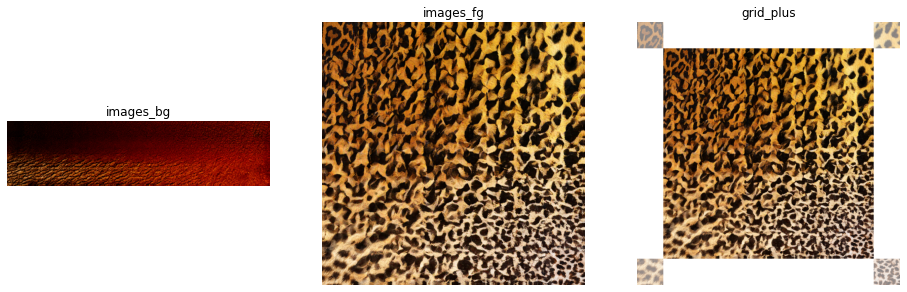

In [ ]:
#@title partie 6
# generate interpolated image
images_bg = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/images_bg.npy")
images_fg = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/images_fg.npy")
print("images_bg.shape :", images_bg.shape)
print("images_fg.shape :", images_fg.shape)

images_fg = images_fg * 127.5 + 127.5; images_fg = images_fg.astype(np.uint8)
images_fg = create_image_grid(images_fg, [1,1]).transpose(1,2,0) # HWC

images_ul = np.array(fg_ul)
images_ul = images_ul * 127.5 + 127.5
images_ul = images_ul.astype(np.uint8)
images_ur = np.array(fg_ur)
images_ur = images_ur * 127.5 + 127.5
images_ur = images_ur.astype(np.uint8)
images_bl = np.array(fg_bl)
images_bl = images_bl * 127.5 + 127.5
images_bl = images_bl.astype(np.uint8)
images_br = np.array(fg_br)
images_br = images_br * 127.5 + 127.5
images_br = images_br.astype(np.uint8)

h_plus = images_ul.shape[2]
w_plus = images_ul.shape[3]
grid_plus = np.ones((images_fg.shape[0]+2*h_plus, images_fg.shape[1]+2*w_plus, images_fg.shape[2])).astype(np.uint8) * 255
grid_plus[:h_plus,:w_plus,:] = create_image_grid(images_ul, [1,1]).transpose(1,2,0)
grid_plus[:h_plus,-w_plus:,:] = create_image_grid(images_ur, [1,1]).transpose(1,2,0)
grid_plus[-h_plus:,:w_plus,:] = create_image_grid(images_bl, [1,1]).transpose(1,2,0)
grid_plus[-h_plus:,-w_plus:,:] = create_image_grid(images_br, [1,1]).transpose(1,2,0)
grid_plus[h_plus:-h_plus, w_plus:-w_plus, :] = images_fg


fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16, 8))

axes[0].imshow(images_bg[0].transpose(1, 2, 0))
axes[0].set_title("images_bg")
axes[0].axis("off")

axes[1].imshow(images_fg)
axes[1].set_title("images_fg")
axes[1].axis("off")

axes[2].imshow(grid_plus)
axes[2].set_title("grid_plus")
axes[2].axis("off")

plt.show()

images_sample_fg_1.shape : (1, 3, 512, 2048)
images_sample_fg_2.shape : (1, 3, 512, 2048)
images_sample_fg_3.shape : (1, 3, 512, 2048)


images_sample_fg_4.shape : (1, 3, 512, 2048)


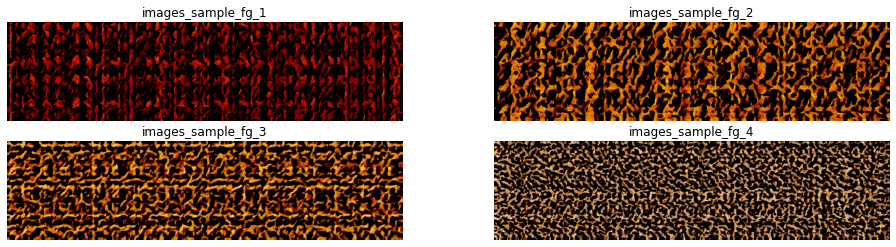

In [ ]:
#@title partie 7
# sample foreground patches and tile
interp_zg_latents_fg_1 = np.tile(np.mean(interp_zg_latents_fg[:, :, sample_fg_1[2]:sample_fg_1[2]+Gs_input_shapes[0][2], sample_fg_1[3]:sample_fg_1[3]+Gs_input_shapes[0][3]], axis=(2,3), keepdims=True), [1, 1, Gs_fcn_bg_input_shapes[0][2], Gs_fcn_bg_input_shapes[0][3]])
interp_zl_latents_fg_1 = np.tile(interp_zl_latents_fg[:, :, sample_fg_1[2]:sample_fg_1[2]+Gs_input_shapes[0][2], sample_fg_1[3]:sample_fg_1[3]+Gs_input_shapes[0][3]], [1, 1, scale_h_bg, scale_w_bg])
permutation_matrix_w_0_fg = permutation_matrix_w_sampler(scale_w_bg)
permutation_matrix_h_0_fg = permutation_matrix_h_sampler(scale_h_bg)
interp_zl_latents_fg_1 = np.matmul(np.matmul(permutation_matrix_h_0_fg, interp_zl_latents_fg_1), permutation_matrix_w_0_fg)
images_sample_fg_1 = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/images_sample_fg_1.npy")
print("images_sample_fg_1.shape :", images_sample_fg_1.shape)
interp_zg_latents_fg_2 = np.tile(np.mean(interp_zg_latents_fg[:, :, sample_fg_2[2]:sample_fg_2[2]+Gs_input_shapes[0][2], sample_fg_2[3]:sample_fg_2[3]+Gs_input_shapes[0][3]], axis=(2,3), keepdims=True), [1, 1, Gs_fcn_bg_input_shapes[0][2], Gs_fcn_bg_input_shapes[0][3]])
interp_zl_latents_fg_2 = np.tile(interp_zl_latents_fg[:, :, sample_fg_2[2]:sample_fg_2[2]+Gs_input_shapes[0][2], sample_fg_2[3]:sample_fg_2[3]+Gs_input_shapes[0][3]], [1, 1, scale_h_bg, scale_w_bg])
permutation_matrix_w_0_fg = permutation_matrix_w_sampler(scale_w_bg)
permutation_matrix_h_0_fg = permutation_matrix_h_sampler(scale_h_bg)
interp_zl_latents_fg_2 = np.matmul(np.matmul(permutation_matrix_h_0_fg, interp_zl_latents_fg_2), permutation_matrix_w_0_fg)
images_sample_fg_2 = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/images_sample_fg_2.npy")
print("images_sample_fg_2.shape :", images_sample_fg_2.shape)
interp_zg_latents_fg_3 = np.tile(np.mean(interp_zg_latents_fg[:, :, sample_fg_3[2]:sample_fg_3[2]+Gs_input_shapes[0][2], sample_fg_3[3]:sample_fg_3[3]+Gs_input_shapes[0][3]], axis=(2,3), keepdims=True), [1, 1, Gs_fcn_bg_input_shapes[0][2], Gs_fcn_bg_input_shapes[0][3]])
interp_zl_latents_fg_3 = np.tile(interp_zl_latents_fg[:, :, sample_fg_3[2]:sample_fg_3[2]+Gs_input_shapes[0][2], sample_fg_3[3]:sample_fg_3[3]+Gs_input_shapes[0][3]], [1, 1, scale_h_bg, scale_w_bg])
permutation_matrix_w_0_fg = permutation_matrix_w_sampler(scale_w_bg)
permutation_matrix_h_0_fg = permutation_matrix_h_sampler(scale_h_bg)
interp_zl_latents_fg_3 = np.matmul(np.matmul(permutation_matrix_h_0_fg, interp_zl_latents_fg_3), permutation_matrix_w_0_fg)
images_sample_fg_3 = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/images_sample_fg_3.npy")
print("images_sample_fg_3.shape :", images_sample_fg_3.shape)
interp_zg_latents_fg_4 = np.tile(np.mean(interp_zg_latents_fg[:, :, sample_fg_4[2]:sample_fg_4[2]+Gs_input_shapes[0][2], sample_fg_4[3]:sample_fg_4[3]+Gs_input_shapes[0][3]], axis=(2,3), keepdims=True), [1, 1, Gs_fcn_bg_input_shapes[0][2], Gs_fcn_bg_input_shapes[0][3]])
interp_zl_latents_fg_4 = np.tile(interp_zl_latents_fg[:, :, sample_fg_4[2]:sample_fg_4[2]+Gs_input_shapes[0][2], sample_fg_4[3]:sample_fg_4[3]+Gs_input_shapes[0][3]], [1, 1, scale_h_bg, scale_w_bg])
permutation_matrix_w_0_fg = permutation_matrix_w_sampler(scale_w_bg)
permutation_matrix_h_0_fg = permutation_matrix_h_sampler(scale_h_bg)
interp_zl_latents_fg_4 = np.matmul(np.matmul(permutation_matrix_h_0_fg, interp_zl_latents_fg_4), permutation_matrix_w_0_fg)
images_sample_fg_4 = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/images_sample_fg_4.npy")
print("images_sample_fg_4.shape :", images_sample_fg_4.shape)

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 4))

L = [images_sample_fg_1, images_sample_fg_2, images_sample_fg_3, images_sample_fg_4]
L_title = ["images_sample_fg_1", "images_sample_fg_2", "images_sample_fg_3", "images_sample_fg_4"]

nrow = 0
ncol = 0
for i in range(len(L)):
  axes[nrow][ncol].imshow(L[i][0].transpose(1,2,0))
  axes[nrow][ncol].set_title(L_title[i])
  axes[nrow][ncol].axis("off")
  ncol +=1
  if ncol==2:
    ncol=0
    nrow+=1
plt.show()

In [ ]:
#@title partie 8
# pre-compute movement
print('stroke configuring...')
im_1 = np.array(Image.open(stroke1_path))
trajectory_1 = im2trajectory(im_1)
im_2 = np.array(Image.open(stroke2_path))
trajectory_2 = im2trajectory(im_2)
im_3 = np.array(Image.open(stroke3_path))
trajectory_3 = im2trajectory(im_3)
im_4 = np.array(Image.open(stroke4_path))
trajectory_4 = im2trajectory(im_4)

orig_1 = [0,0]; orig_2 = [0, 128]; orig_3 = [0, 256]; orig_4 = [0, 384]
kernel_weight_1 = [np.zeros((Gs_fcn_bg_input_shapes[0][2], Gs_fcn_bg_input_shapes[0][3]))]
kernel_weight_2 = [np.zeros((Gs_fcn_bg_input_shapes[0][2], Gs_fcn_bg_input_shapes[0][3]))]
kernel_weight_3 = [np.zeros((Gs_fcn_bg_input_shapes[0][2], Gs_fcn_bg_input_shapes[0][3]))]
kernel_weight_4 = [np.zeros((Gs_fcn_bg_input_shapes[0][2], Gs_fcn_bg_input_shapes[0][3]))]
for spot in trajectory_1:
    y = orig_1[0] + spot[0]
    x = orig_1[1] + spot[1]
    kernel_weight_1.append(np.maximum(kernel_weight_1[-1], gkern_for_weight_arbitrary_shape(out_h=Gs_fcn_bg_input_shapes[0][2], out_w=Gs_fcn_bg_input_shapes[0][3], x=x, y=y, sig_div=stroke_radius_div))) #sig_div=stroke_radius_div*4.0
    kernel_weight_2.append(kernel_weight_2[-1])
    kernel_weight_3.append(kernel_weight_3[-1])
    kernel_weight_4.append(kernel_weight_4[-1])
for spot in trajectory_2:
    y = orig_2[0] + spot[0]
    x = orig_2[1] + spot[1]
    kernel_weight_1.append(kernel_weight_1[-1])
    kernel_weight_2.append(np.maximum(kernel_weight_2[-1], gkern_for_weight_arbitrary_shape(out_h=Gs_fcn_bg_input_shapes[0][2], out_w=Gs_fcn_bg_input_shapes[0][3], x=x, y=y, sig_div=stroke_radius_div))) #sig_div=stroke_radius_div*2.0
    kernel_weight_3.append(kernel_weight_3[-1])
    kernel_weight_4.append(kernel_weight_4[-1])
for spot in trajectory_3:
    y = orig_3[0] + spot[0]
    x = orig_3[1] + spot[1]
    kernel_weight_1.append(kernel_weight_1[-1])
    kernel_weight_2.append(kernel_weight_2[-1])
    kernel_weight_3.append(np.maximum(kernel_weight_3[-1], gkern_for_weight_arbitrary_shape(out_h=Gs_fcn_bg_input_shapes[0][2], out_w=Gs_fcn_bg_input_shapes[0][3], x=x, y=y, sig_div=stroke_radius_div))) #sig_div=stroke_radius_div
    kernel_weight_4.append(kernel_weight_4[-1])
for spot in trajectory_4:
    y = orig_4[0] + spot[0]
    x = orig_4[1] + spot[1]
    kernel_weight_1.append(kernel_weight_1[-1])
    kernel_weight_2.append(kernel_weight_2[-1])
    kernel_weight_3.append(kernel_weight_3[-1])
    kernel_weight_4.append(np.maximum(kernel_weight_4[-1], gkern_for_weight_arbitrary_shape(out_h=Gs_fcn_bg_input_shapes[0][2], out_w=Gs_fcn_bg_input_shapes[0][3], x=x, y=y, sig_div=stroke_radius_div))) #sig_div=stroke_radius_div/1.25

kernel_weight_1_cur = np.tile(kernel_weight_1[-1][np.newaxis, np.newaxis, :, :], [1, Es_zl_output_shapes[0][1], 1, 1])
kernel_weight_2_cur = np.tile(kernel_weight_2[-1][np.newaxis, np.newaxis, :, :], [1, Es_zl_output_shapes[0][1], 1, 1])
kernel_weight_3_cur = np.tile(kernel_weight_3[-1][np.newaxis, np.newaxis, :, :], [1, Es_zl_output_shapes[0][1], 1, 1])
kernel_weight_4_cur = np.tile(kernel_weight_4[-1][np.newaxis, np.newaxis, :, :], [1, Es_zl_output_shapes[0][1], 1, 1])
interp_zg_brush = interp_zg_latents_fg_1 * kernel_weight_1_cur + interp_zg_latents_bg * (1.0 - kernel_weight_1_cur)
interp_zg_brush = interp_zg_latents_fg_2 * kernel_weight_2_cur + interp_zg_brush * (1.0 - kernel_weight_2_cur)
interp_zg_brush = interp_zg_latents_fg_3 * kernel_weight_3_cur + interp_zg_brush * (1.0 - kernel_weight_3_cur)
interp_zg_brush = interp_zg_latents_fg_4 * kernel_weight_4_cur + interp_zg_brush * (1.0 - kernel_weight_4_cur)
interp_zl_brush = interp_zl_latents_fg_1 * kernel_weight_1_cur + interp_zl_latents_bg * (1.0 - kernel_weight_1_cur)
interp_zl_brush = interp_zl_latents_fg_2 * kernel_weight_2_cur + interp_zl_brush * (1.0 - kernel_weight_2_cur)
interp_zl_brush = interp_zl_latents_fg_3 * kernel_weight_3_cur + interp_zl_brush * (1.0 - kernel_weight_3_cur)
interp_zl_brush = interp_zl_latents_fg_4 * kernel_weight_4_cur + interp_zl_brush * (1.0 - kernel_weight_4_cur)
images_brush = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/images_brush.npy")


stroke configuring...


## 3.2 Naive Alpha Blending avec leurs textures

Nous allons pouvoir tester nos fonctions de brush avec les résultats de l'interpolation du github. Ce résultat est très intéressant car la mise en marche de TextureMixer est très longue (entre 4h-6h) pour obtenir un résultat. Mais, ci-dessous on remarque que les interpolations extraites se font en moins de 5 minutes. Ce sont les denrières étapes qui prennent le plus de temps.

Nous voyons ci-après que notre résultat est très proche du papier de base. Une piste d'amélioration serait donc d'introduire une étape de l'algorithme de Naive Alpha Blending dans la pipeline de notre interpolation.

Nous allons voir par la suite quelles sont les parties du code à modifier.

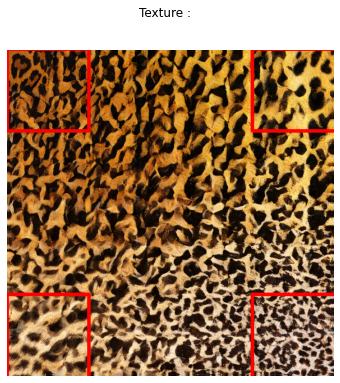

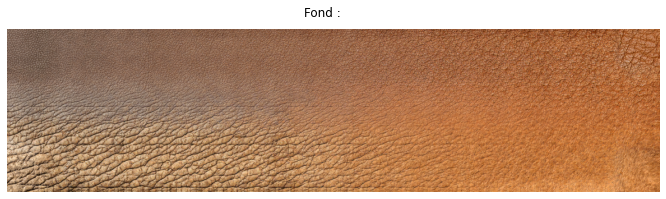

In [ ]:
#@title les interpolations du papier

texture = images_fg.copy()

size = int(0.25 * texture.shape[0])

X = [[0, size], [1024-size, 1204], [0, size], [1024-size, 1204]]
Y = [[0, size], [0, size], [1024-size, 1204], [1024-size, 1204]]

for i in range(len(X)):
  texture = cv2.rectangle(texture, (X[i][1], Y[i][1]), (X[i][0], Y[i][0]), (255,0,0), 10)

fig = plt.figure(figsize=(6, 6))
plt.imshow(texture)
fig.suptitle("Texture :")
plt.axis("off")
plt.show()

fig = plt.figure(figsize=(12, 3))
plt.imshow(result_paper[0])
fig.suptitle("Fond :")
plt.axis("off")
plt.show()

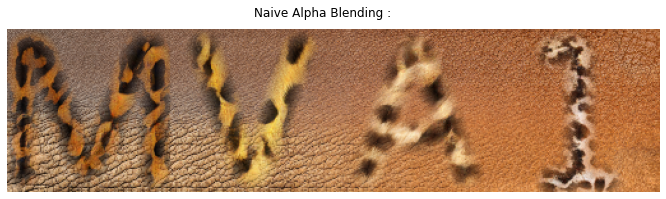

affichage et calcul en : 22.962795972824097


In [ ]:
#@title naive_alpha_blending

t_start = time.time()

texture = images_fg.copy()
output = cv2.resize(result_paper[0].copy(), (128*4, 128))

for i, letter in enumerate(["M", "V", "A", "1"]):
  img1 = output[:, 128*i:128*(i+1)]
  img2 = cv2.resize(texture[Y[i][0]:Y[i][1], X[i][0]:X[i][1]], (128, 128))
  
  output[:, 128*i:128*(i+1)] = naive_alpha_blending(img2, img1, letters[i], 15)

fig = plt.figure(figsize=(12, 3))
fig.suptitle("Naive Alpha Blending :")
plt.axis("off")
plt.imshow(output)
plt.show()
print("affichage et calcul en :", time.time()-t_start)

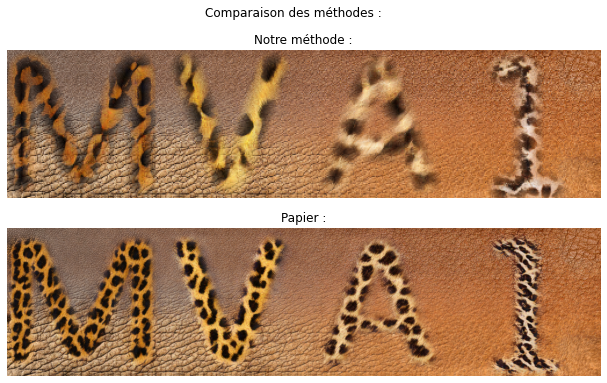

In [ ]:
#@title Comparaisons

ours = output.copy()
paper = result_paper[-1].copy()

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 6))

fig.suptitle("Comparaison des méthodes :")

axes[0].imshow(ours)
axes[0].axis("off")
axes[0].set_title("Notre méthode :")

axes[1].imshow(paper)
axes[1].axis("off")
axes[1].set_title("Papier :")

plt.show()

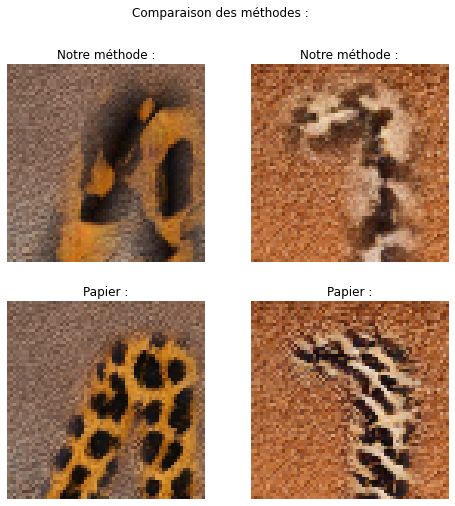

In [ ]:
#@title Zoom comparaisons

ours = output.copy()
paper = result_paper[-1].copy()

save_all_fig = []
zoom = 1/2

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))

fig.suptitle("Comparaison des méthodes :")

img = cv2.resize(ours.copy()[:128, :128], (128, 128))
img_all = cv2.rectangle(img.copy(), (len(img)-int(len(img)*zoom), 0), (len(img), int(len(img)*zoom)), (255,0,0), int(len(img)*zoom/40))

axes[0][0].imshow(img[:int(len(img)*zoom), -int(len(img)*zoom):])
axes[0][0].axis("off")
axes[0][0].set_title("Notre méthode :")

pixel_crop = zoom*128
img = cv2.resize(ours.copy()[:, -128:], (128, 128))
img_all = cv2.rectangle(img.copy(), (len(img)-2*int(len(img)*zoom), 0), (len(img)-int(len(img)*zoom), int(len(img)*zoom)), (255,0,0), int(len(img)*zoom/40))
  
axes[0][1].imshow(img[:int(len(img)*zoom), int(64-pixel_crop/2)-10:int(64+pixel_crop/2)-10])
axes[0][1].axis("off")
axes[0][1].set_title("Notre méthode :")


paper = cv2.resize(paper.copy(), (128*4, 128))
img = cv2.resize(paper.copy()[:128, :128], (128, 128))
img_all = cv2.rectangle(img.copy(), (len(img)-int(len(img)*zoom), 0), (len(img), int(len(img)*zoom)), (255,0,0), int(len(img)*zoom/40))

axes[1][0].imshow(img[:int(len(img)*zoom), -int(len(img)*zoom):])
axes[1][0].axis("off")
axes[1][0].set_title("Papier :")

img = cv2.resize(paper.copy()[:, -128:], (128, 128))
img_all = cv2.rectangle(img.copy(), (len(img)-2*int(len(img)*zoom), 0), (len(img)-int(len(img)*zoom), int(len(img)*zoom)), (255,0,0), int(len(img)*zoom/40))
  
axes[1][1].imshow(img[:int(len(img)*zoom), int(64-pixel_crop/2-10):int(64+pixel_crop/2)-10])
axes[1][1].axis("off")
axes[1][1].set_title("Papier :")

plt.show()

## 3.3 Palette de peinture

Nous pouvons également générer la palette de textures pour commencer à peindre mais, celle-ci est moins belle que le résultat d'un interpolation.

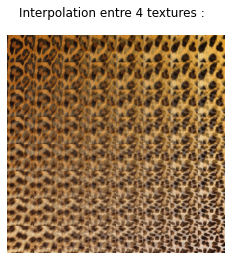

affichage et calcul en : 1.5435216426849365


In [ ]:
#@title Palette

#@title le fond à peindre
t_start = time.time()
outputFgUL = np.zeros((1024, 1024, 3), np.uint8)
for i in range(8):
  for j in range(8):
    outputFgUL[128*j:128*(j+1), 128*i:128*(i+1)] = imageFgUL

outputFgUR = np.zeros((1024, 1024, 3), np.uint8)
for i in range(8):
  for j in range(8):
    outputFgUR[128*j:128*(j+1), 128*i:128*(i+1)] = imageFgUR

outputFgBL = np.zeros((1024, 1024, 3), np.uint8)
for i in range(8):
  for j in range(8):
    outputFgBL[128*j:128*(j+1), 128*i:128*(i+1)] = imageFgBL

outputFgBR = np.zeros((1024, 1024, 3), np.uint8)
for i in range(8):
  for j in range(8):
    outputFgBR[128*j:128*(j+1), 128*i:128*(i+1)] = imageFgBR

output = np.zeros((1024, 1024, 3), np.uint8)

nb_patch = 100
for i in range(nb_patch):
  for j in range(nb_patch):

    start_i = int(output.shape[1]/nb_patch  * i)
    end_i = int(output.shape[1]/nb_patch  * (i + 1))
    
    start_j = int(output.shape[0]/nb_patch  * j)
    end_j = int(output.shape[0]/nb_patch  * (j + 1))

    alpha_i = i / (nb_patch-1)
    alpha_j = j / (nb_patch-1)
    output[start_j:end_j, start_i:end_i] = outputFgUL[start_j:end_j, start_i:end_i]*(1-alpha_i)*(1-alpha_j) \
                                         + outputFgBR[start_j:end_j, start_i:end_i]*(alpha_i)*(alpha_j) \
                                         + outputFgUR[start_j:end_j, start_i:end_i]*(alpha_i)*(1-alpha_j) \
                                         + outputFgBL[start_j:end_j, start_i:end_i]*(1-alpha_i)*(alpha_j)
fig = plt.figure(figsize=(4, 4))
fig.suptitle("Interpolation entre 4 textures :")
plt.axis("off")
plt.imshow(output)
plt.show()
print("affichage et calcul en :", time.time()-t_start)

fond_a_peindre = output.copy()
save_results = []

## 3.4 Les différents modèles

Le github nous fournit plusieurs modèles que nous détaillerons plus tard. Il a été possible de récupérer les poids en utilisant les fonctions suivantes. 

Pour toute réimplémentation ou hybridation des frameworks, il est nécessaire de se confronter aux changements de versions qui ont eu lieu depuis 2019. Nous noterons qu'une première réimplémentation en Pytorch peut s'effectuer via une extraction des poids et des couches d'apprentissage ci-dessous.

Néanmoins, pour nos expérimentations, des erreurs sont arrivées et, la librairie de réseaux de neurones importait peu pour la compréhension de nos expériences. Nous avons donc continué d'utiliser la librairie de base.

In [ ]:
#@title Affichage des layers

!python3.6 /content/drive/MyDrive/TextureMixer3/layers.py --model_path /content/drive/MyDrive/TextureMixer3/models/animal_texture/network-final.pkl

Initializing TensorFlow...




The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.










____________________
____________________

E_zg                        Params      OutputShape             WeightShape             
---                         ---         ---                     ---                     
images_in                   -           (?, 3, 128, 128)        -                       
lod                         -           ()                      -                       
Less                        -           ()                      -                       
cond                        -           (?, 512, 4, 4)          -                       
FromRGB_lod0       

# 4. Les limites

images_bg.shape : (1, 3, 512, 2048)


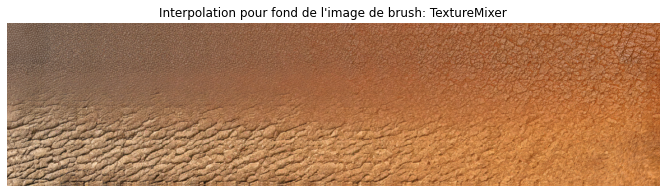

In [ ]:
#@title Affichage du fond d'interpolation brush TextureMixer, et des interpolations horizontales

def adjust_dynamic_range(data, drange_in, drange_out):
    if drange_in != drange_out:
        scale = (np.float32(drange_out[1]) - np.float32(drange_out[0])) / (np.float32(drange_in[1]) - np.float32(drange_in[0]))
        bias = (np.float32(drange_out[0]) - np.float32(drange_in[0]) * scale)
        data = data * scale + bias
    return data

# show interpolated background image from TextureMixer
images_bg = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/images_bg.npy") # obtenu par le run de app brush et extrait au moment de la génération
#images_fg = np.load("/content/drive/MyDrive/TextureMixer3/save_brush/images_fg.npy")
print("images_bg.shape :", images_bg.shape)

plt.figure(figsize=(12, 3))
plt.imshow(adjust_dynamic_range((images_bg[0].transpose(1, 2, 0)), [-1,1], [0,1]))
plt.title("Interpolation pour fond de l'image de brush: TextureMixer")
plt.axis("off")
plt.show()

On peut noter l'apparition d'un effet de flou au centre de l'image, mais des transitions plus douces liées à la partie générative du réseau qui utilise un encodeur global et un encodeur global.  

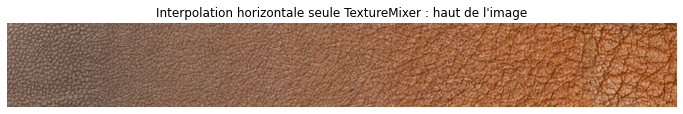

In [ ]:
#@title Interpolation TextureMixer horizontale: partie supérieure du fond
#interpolations horizontales : temps de processing = 1min chacune
import matplotlib.image as mpimg
plt.figure(figsize=(12, 3))
plt.title("Interpolation horizontale seule TextureMixer : haut de l'image")
plt.imshow(mpimg.imread('/content/drive/MyDrive/TextureMixer3/results/animal_texture/horizontal_interpolation/Copy of 1000_F_23745067_w0GkcAIQG2C4hxOelI1aQYZglEXggGRS_NW_aug00000000-interplatingTo-1000_F_44327602_E6wl8FNihQON8c704fE5DEY2LOJPQQ1V_NW_aug00000018.png'))
plt.axis("off")
plt.show()

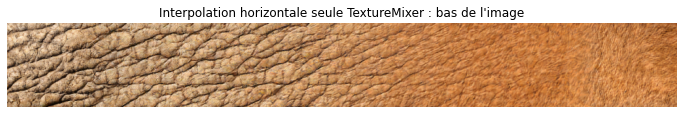

In [ ]:
#@title Interpolation TextureMixer horizontale: partie inférieure du fond
plt.figure(figsize=(12, 3))
plt.title("Interpolation horizontale seule TextureMixer : bas de l'image")
plt.imshow(mpimg.imread('/content/drive/MyDrive/TextureMixer3/results/animal_texture/horizontal_interpolation/Copy of 1000_F_66218716_rxcsXWQzYpIWVB8a09ZcuNzE7qAJ3HEk_NW_aug00000098-interplatingTo-1000_F_40846588_APKTS3BpiRvR1nvUx0FRa7qjjR788zt8_NW_aug00000001.png'))
plt.axis("off")
plt.show()

On peut par la suite envisager d'afficher des familles de textures initialement non sélectionnées par TextureMixer afin de voir l'extensibilité du modèle sans effectuer plusieurs jours de ré-entraînement, et la comparaison avec des techniques plus basiques mais également plus rapides.

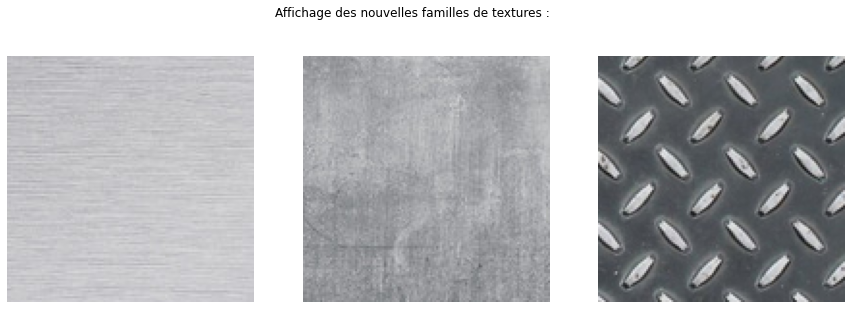

In [ ]:
#@title Affichage des nouvelles familles de textures
import matplotlib.image as mpimg

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
fig.suptitle("Affichage des nouvelles familles de textures :")
axes[0].imshow(mpimg.imread('/content/drive/MyDrive/TextureMixer3/examples/metalbb.png'))
axes[1].imshow(mpimg.imread('/content/drive/MyDrive/TextureMixer3/examples/metalcb.png'))
axes[2].imshow(mpimg.imread('/content/drive/MyDrive/TextureMixer3/examples/metaldb.png'))
axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")
plt.show()

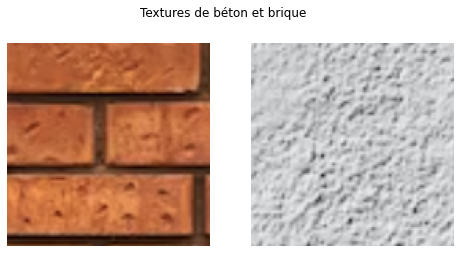

In [ ]:
#@title Textures de béton et brique

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
plt.suptitle("Textures de béton et brique")

axes[0].imshow(mpimg.imread('/content/drive/MyDrive/TextureMixer3/examples/mur1.png'))
axes[1].imshow(mpimg.imread('/content/drive/MyDrive/TextureMixer3/examples/mur2.png'))

axes[0].axis("off")
axes[1].axis("off")

plt.show()

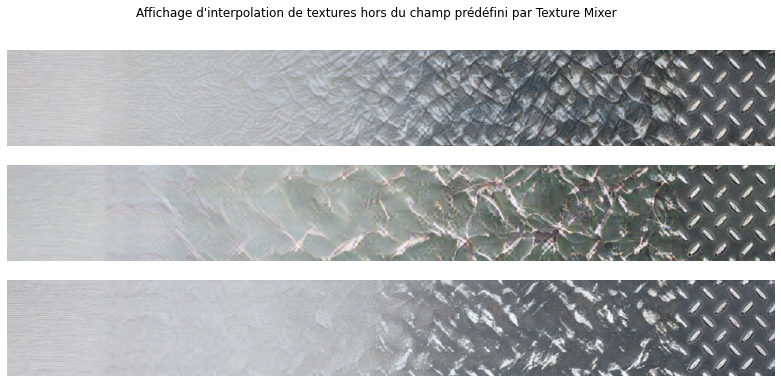

In [ ]:
#@title Affichage d'interpolation de textures hors du champ prédéfini par Texture Mixer

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 6))
fig.suptitle("Affichage d'interpolation de textures hors du champ prédéfini par Texture Mixer")
axes[0].imshow(mpimg.imread('/content/drive/MyDrive/TextureMixer3/results/animal_texture/horizontal_interpolation/metalbb-interplatingTo-metaldb.png'))
axes[1].imshow(mpimg.imread('/content/drive/MyDrive/TextureMixer3/results/plant_texture/metalbb-interplatingTo-metaldb.png'))
axes[2].imshow(mpimg.imread('/content/drive/MyDrive/TextureMixer3/results/metalbb-interplatingTo-metaldb.png'))

axes[0].axis("off")
axes[1].axis("off")
axes[2].axis("off")

plt.show()

Lorsque l'on sort des familles de pré-modèles, ou l'apparition d'artefacts non désirés (apparence d'écailles ou de racines sur le métal). 
On peut noter que la famille de texture "earth" donne un résultat plus satisfaisant, bien que les textons à droite soient "dissous" de façon assez brusque. 
L'interpolation simple prend entre 52 et 57s (CPU time)

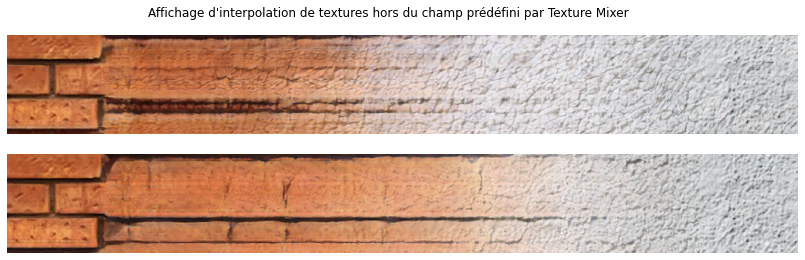

In [ ]:
#@title Affichage d'interpolation de textures hors du champ prédéfini par Texture Mixer

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(16, 4))
fig.suptitle("Affichage d'interpolation de textures hors du champ prédéfini par Texture Mixer")
axes[0].imshow(mpimg.imread('/content/drive/MyDrive/TextureMixer3/results/animal_texture/horizontal_interpolation/mur1-interplatingTo-mur2.png'))
axes[1].imshow(mpimg.imread('/content/drive/MyDrive/TextureMixer3/results/earth_texture/Copy of mur1-interplatingTo-mur2.png'))

axes[0].axis("off")
axes[1].axis("off")

plt.show()

>> Ici des **artefacts** liés aux textons de la brique réagissent différemment, encore une fois le pré-modèle "earth" donne un résultat correct lié aux similarités de grain, et même la famille de pré-modèles "animal" donne un résultat moins choquant que pour le métal.

L'interpolation simple prend entre 52 et 57s (CPU time)

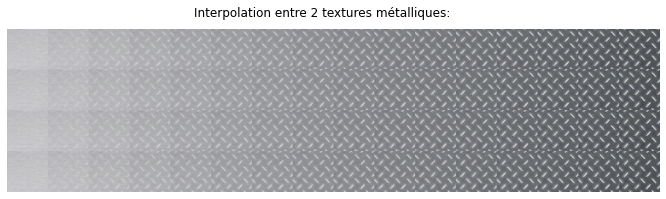

affichage et calcul en : 0.531914472579956


In [ ]:
#@title Comparaison fond métallique par notre méthode baseline

imageBgUL_path = "/content/drive/MyDrive/TextureMixer3/examples/metalbb.png"
imageBgUR_path = "/content/drive/MyDrive/TextureMixer3/examples/metaldb.png"
imageBgBL_path = "/content/drive/MyDrive/TextureMixer3/examples/metalbb.png"
imageBgBR_path = "/content/drive/MyDrive/TextureMixer3/examples/metaldb.png"

imageBgUL = cv2.imread(imageBgUL_path)
imageBgUR = cv2.imread(imageBgUR_path)
imageBgBL = cv2.imread(imageBgBL_path)
imageBgBR = cv2.imread(imageBgBR_path)

imageBgUL = cv2.cvtColor(imageBgUL, cv2.COLOR_BGR2RGB)
imageBgUR = cv2.cvtColor(imageBgUR, cv2.COLOR_BGR2RGB)
imageBgBL = cv2.cvtColor(imageBgBL, cv2.COLOR_BGR2RGB)
imageBgBR = cv2.cvtColor(imageBgBR, cv2.COLOR_BGR2RGB)


t_start = time.time()
outputBgUL = np.zeros((512, 2048, 3), np.uint8)
for i in range(16):
  for j in range(4):
    outputBgUL[128*j:128*(j+1), 128*i:128*(i+1)] = imageBgUL

outputBgUR = np.zeros((512, 2048, 3), np.uint8)
for i in range(16):
  for j in range(4):
    outputBgUR[128*j:128*(j+1), 128*i:128*(i+1)] = imageBgUR

outputBgBL = np.zeros((512, 2048, 3), np.uint8)
for i in range(16):
  for j in range(4):
    outputBgBL[128*j:128*(j+1), 128*i:128*(i+1)] = imageBgBL

outputBgBR = np.zeros((512, 2048, 3), np.uint8)
for i in range(16):
  for j in range(4):
    outputBgBR[128*j:128*(j+1), 128*i:128*(i+1)] = imageBgBR

output = np.zeros((512, 2048, 3), np.uint8)

nb_patch = 100
for i in range(nb_patch):
  for j in range(nb_patch):

    start_i = int(output.shape[1]/nb_patch  * i)
    end_i = int(output.shape[1]/nb_patch  * (i + 1))
    
    start_j = int(output.shape[0]/nb_patch  * j)
    end_j = int(output.shape[0]/nb_patch  * (j + 1))

    alpha_i = i / (nb_patch-1)
    alpha_j = j / (nb_patch-1)
    output[start_j:end_j, start_i:end_i] = outputBgUL[start_j:end_j, start_i:end_i]*(1-alpha_i)*(1-alpha_j) \
                                         + outputBgBR[start_j:end_j, start_i:end_i]*(alpha_i)*(alpha_j) \
                                         + outputBgUR[start_j:end_j, start_i:end_i]*(alpha_i)*(1-alpha_j) \
                                         + outputBgBL[start_j:end_j, start_i:end_i]*(1-alpha_i)*(alpha_j)
fig = plt.figure(figsize=(12, 3))
fig.suptitle("Interpolation entre 2 textures métalliques:")
plt.axis("off")
plt.imshow(output)
plt.show()
print("affichage et calcul en :", time.time()-t_start)

fond_a_peindre = output.copy()
save_results = []

Sans surprise la méthode alpha naïve délivre des résultats très proches de l'apprentissage réalisé par TextureMixer **lorsque le shuffling n'est pas activé** : les répétitions deviennent alors apparentes. Les textons du métal de droite persistent bien plus longtemps du fait de la répétition des modèles. 



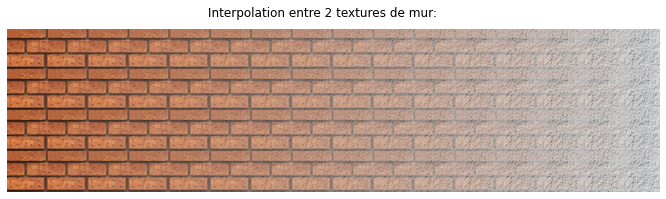

affichage et calcul en : 0.7382876873016357


In [ ]:
#@title fond mur par notre méthode baseline

imageBgUL_path = "/content/drive/MyDrive/TextureMixer3/examples/mur1.png"
imageBgUR_path = "/content/drive/MyDrive/TextureMixer3/examples/mur2.png"
imageBgBL_path = "/content/drive/MyDrive/TextureMixer3/examples/mur1.png"
imageBgBR_path = "/content/drive/MyDrive/TextureMixer3/examples/mur2.png"

imageBgUL = cv2.imread(imageBgUL_path)
imageBgUR = cv2.imread(imageBgUR_path)
imageBgBL = cv2.imread(imageBgBL_path)
imageBgBR = cv2.imread(imageBgBR_path)

imageBgUL = cv2.cvtColor(imageBgUL, cv2.COLOR_BGR2RGB)
imageBgUR = cv2.cvtColor(imageBgUR, cv2.COLOR_BGR2RGB)
imageBgBL = cv2.cvtColor(imageBgBL, cv2.COLOR_BGR2RGB)
imageBgBR = cv2.cvtColor(imageBgBR, cv2.COLOR_BGR2RGB)


t_start = time.time()
outputBgUL = np.zeros((512, 2048, 3), np.uint8)
for i in range(16):
  for j in range(4):
    outputBgUL[128*j:128*(j+1), 128*i:128*(i+1)] = imageBgUL

outputBgUR = np.zeros((512, 2048, 3), np.uint8)
for i in range(16):
  for j in range(4):
    outputBgUR[128*j:128*(j+1), 128*i:128*(i+1)] = imageBgUR

outputBgBL = np.zeros((512, 2048, 3), np.uint8)
for i in range(16):
  for j in range(4):
    outputBgBL[128*j:128*(j+1), 128*i:128*(i+1)] = imageBgBL

outputBgBR = np.zeros((512, 2048, 3), np.uint8)
for i in range(16):
  for j in range(4):
    outputBgBR[128*j:128*(j+1), 128*i:128*(i+1)] = imageBgBR

output = np.zeros((512, 2048, 3), np.uint8)

nb_patch = 100
for i in range(nb_patch):
  for j in range(nb_patch):

    start_i = int(output.shape[1]/nb_patch  * i)
    end_i = int(output.shape[1]/nb_patch  * (i + 1))
    
    start_j = int(output.shape[0]/nb_patch  * j)
    end_j = int(output.shape[0]/nb_patch  * (j + 1))

    alpha_i = i / (nb_patch-1)
    alpha_j = j / (nb_patch-1)
    output[start_j:end_j, start_i:end_i] = outputBgUL[start_j:end_j, start_i:end_i]*(1-alpha_i)*(1-alpha_j) \
                                         + outputBgBR[start_j:end_j, start_i:end_i]*(alpha_i)*(alpha_j) \
                                         + outputBgUR[start_j:end_j, start_i:end_i]*(alpha_i)*(1-alpha_j) \
                                         + outputBgBL[start_j:end_j, start_i:end_i]*(1-alpha_i)*(alpha_j)
fig = plt.figure(figsize=(12, 3))
fig.suptitle("Interpolation entre 2 textures de mur:")
plt.axis("off")
plt.imshow(output)
plt.show()
print("affichage et calcul en :", time.time()-t_start)

fond_a_peindre = output.copy()
save_results = []

Ici la structure de répétition de la brique fonctionne à l'avantage de la méthode **baseline**, même si l'on peut encore deviner la texture de gauche jusqu'à la droite de l'image

# 5. Pistes d'améliorations



## 5.1 Ajout de bruit

L'introduction de bruit dans les problèmes d'interpolation peut aider à masquer certains artefacts qui peuvent apparaître lors de la reconstruction d'une image. Les artefacts peuvent se présenter pour plusieurs raisons, telles que des erreurs de mesure dans les données d'entrée, des algorithmes d'interpolation inadéquats ou des algorithmes qui ne tiennent pas compte de certaines propriétés de l'image originelle.

L'introduction de bruit peut aider à dissimuler ces artefacts en masquant les irrégularités dans les données d'interpolation. Cependant, il est important de noter que trop de bruit peut également masquer les détails importants de l'image de base, ce qui peut rendre l'interpolation moins fiable pour les applications qui requièrent une qualité d'image élevée.

Le bruit gaussien est un type de bruit aléatoire qui est souvent utilisé pour ajouter du bruit à des images en vue de simuler des conditions réelles. Il est appelé "gaussien" car sa distribution de probabilité est donnée par la fonction de densité de probabilité gaussienne. Le bruit gaussien est un bruit blanc, ce qui signifie qu'il a une moyenne nulle et une variance constante.

$${\displaystyle f(x)={\frac {1}{\sigma {\sqrt {2\pi }}}}e^{-{\frac {1}{2}}\left({\frac {x-\mu }{\sigma }}\right)^{2}}}$$

Le bruit gaussien peut être utile pour masquer les artefacts dans les problèmes d'interpolation, car il ajoute du bruit de manière aléatoire et uniforme à l'image. Il est également possible de contrôler la variance du bruit gaussien pour ajuster le niveau de bruit ajouté à l'image. Une variance faible limitera la quantité de bruit ajoutée à l'image, tandis qu'une variance plus élevée ajoutera davantage de bruit. Il est donc important de choisir une variance appropriée pour atteindre un équilibre entre la dissimulation des artefacts et la préservation de la qualité de l'image originale.



100%|██████████| 256/256 [00:00<00:00, 336.71it/s]


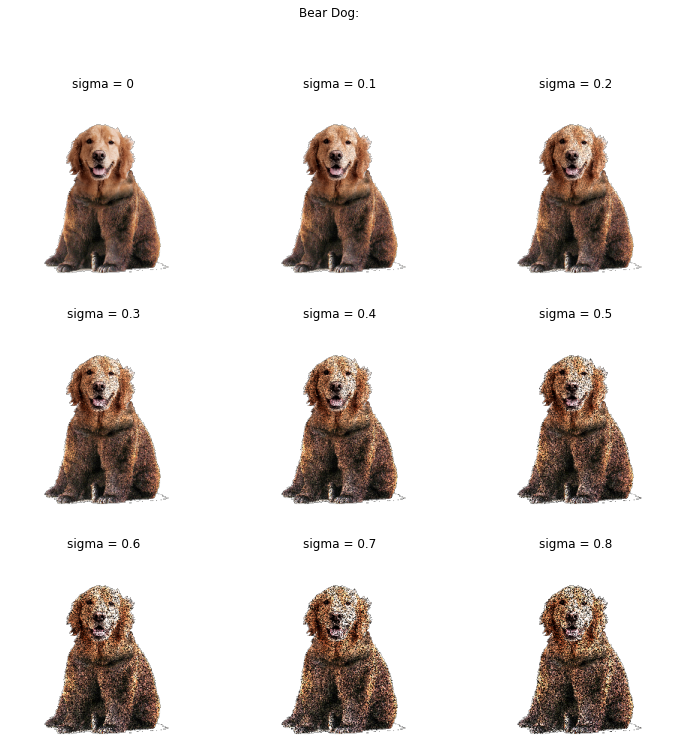

In [ ]:
#@title on bruite

def hybridation(sigma, size=256):
  L1 = []
  L2 = []

  img1 = cv2.resize(mpimg.imread("/content/drive/MyDrive/TextureMixer3/hybridization_fig/beardog/sample1.png"), (size, size))
  img2 = cv2.resize(mpimg.imread("/content/drive/MyDrive/TextureMixer3/hybridization_fig/beardog/sample2.png"), (size, size))
  img3 = cv2.resize(mpimg.imread("/content/drive/MyDrive/TextureMixer3/hybridization_fig/beardog/interp_region.png"), (size, size))
  img4 = cv2.resize(mpimg.imread("/content/drive/MyDrive/TextureMixer3/hybridization_fig/beardog/sample1_CAF.png"), (size, size))
  img5 = cv2.resize(mpimg.imread("/content/drive/MyDrive/TextureMixer3/hybridization_fig/beardog/sample2_CAF.png"), (size, size))

  output = np.zeros(img1.shape)

  for i in range(len(img1)):
    for j in range(len(img1[0])):

      if img1[i][j][3] !=0:
        output[i][j] = img1[i][j]*random.gauss(1, sigma)
        output[i][j][3] = 1
      elif img2[i][j][3] !=0:
        output[i][j] = img2[i][j]*random.gauss(1, sigma)
        output[i][j][3] = 1

      if img1[i-1][j][3] == 0 and img1[i][j][3] != 0:
        L1.append([i, j])
        # output[i][j]=[0,1,0,1]

      if img2[i][j][3] !=0 and img2[i+1][j][3] ==0:
        L2.append([i, j])
        # output[i][j]=[1,0,0,1]

  output2 = output.copy()

  for i in tqdm(range(len(img1))):
    for j in range(len(img1[0])):
      if img3[i][j][3] == 1:
        distance1 = min([sqrt((i-coord[0])**2+(j-coord[1])**2)for coord in L1])
        distance2 = min([sqrt((i-coord[0])**2+(j-coord[1])**2)for coord in L2])
        output2[i][j] = img4[i][j]*(distance1/(distance1+distance2))*random.gauss(1, sigma) + img5[i][j]*(distance2/(distance1+distance2))*random.gauss(1, sigma)
        output2[i][j][3] = 1
  return output2


fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12, 12))
fig.suptitle("Bear Dog:")
plt.axis("off")

sigma = 0
for col in range(3):
  for row in range(3):
    axes[col][row].imshow(hybridation(sigma, size=256))
    axes[col][row].set_title("sigma = " + str(round(sigma,1)))
    axes[col][row].axis("off")
    sigma += 0.1
plt.show()

On remarque que le bruitage fait petit à petit disparaitre les problèmes d'artefact aux niveaux des raccords entre les textures. Le problème qui intervient ici va être la perte de qualité.

## 5.2 Le débruitage

Il existe plusieurs méthodes pour débruiter une image en Python. Trois des méthodes les plus courantes sont le filtre Gaussien, le filtre médian et le filtre Non-local Means.

- Le filtre Gaussien est un des filtres les plus simples et les plus rapides à implémenter. Il fonctionne en remplaçant chaque pixel par la moyenne pondérée des pixels dans une fenêtre autour de celui-ci. L'avantage de ce filtre est qu'il est très rapide et peut enlever une grande quantité de bruit de l'image. Cependant, il peut également rendre l'image trop floue et faire perdre des détails importants.

- Le filtre médian est une autre méthode couramment utilisée pour débruiter les images. Il fonctionne en remplaçant chaque pixel par la valeur médiane des pixels dans une fenêtre autour de celui-ci. Cette méthode peut aider à enlever le bruit tout en préservant les détails de l'image originale. Cependant, cette méthode peut être plus lente que le filtre Gaussien et peut également entraîner une perte de détails si la taille de la fenêtre est trop grande.

- Le filtre Non-local Means est une méthode plus avancée pour débruiter les images. Il compare chaque pixel à tous les autres pixels dans l'image pour trouver les pixels les plus similaires et calcule une moyenne pondérée pour remplacer la valeur du pixel. Cette méthode peut fournir des résultats de qualité supérieure à ceux des filtres Gaussien et médian, en particulier pour les images très bruitées. Cependant, elle peut être plus lente que les autres méthodes et peut également entraîner une perte de détails si le niveau de débruitage est trop élevé.

100%|██████████| 256/256 [00:00<00:00, 326.32it/s]


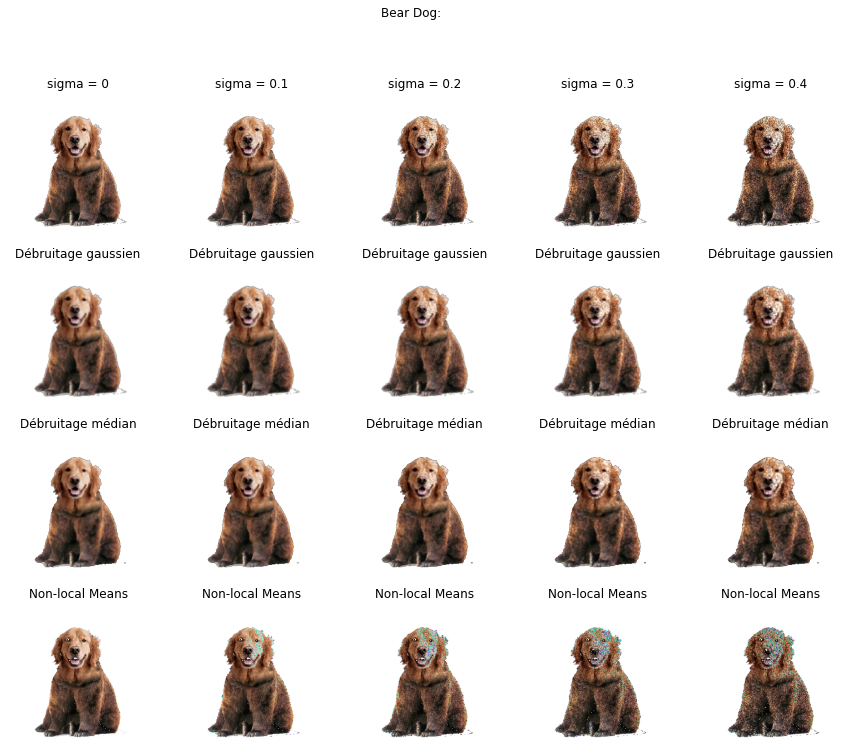

In [ ]:
#@title débruitage

def gaussian_filter(img, kernel_size=3):
    # Initialiser les paramètres du filtre Gaussien
    kernel_size = int(kernel_size)

    # Convertir l'image en numpy array
    img = np.array(img)

    # Appliquer le filtre Gaussien à l'image
    smoothed = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

    # Retourner l'image filtrée
    return smoothed


def median_filter(img, kernel_size=3):
    # Initialiser les paramètres du filtre médian
    kernel_size = int(kernel_size)

    # Convertir l'image en numpy array
    img = np.array(img).astype('float32')

    # Appliquer le filtre médian à l'image
    smoothed = cv2.medianBlur(img, kernel_size)

    # Retourner l'image filtrée
    return smoothed

def non_local_means(img, h=3):
    # Convertir l'image en numpy array
    img = np.array(img)[:,:,:3]
    img = np.uint8(img*255)


    # Déterminer le nombre de canaux dans l'image
    if len(img.shape) == 2:
        # Image en niveaux de gris
        img = cv2.fastNlMeansDenoising(img, None, h, 7, 21)
    else:
        # Image couleur
        img = cv2.fastNlMeansDenoisingColored(img, None, h, h, 7, 21)
        for i in range(len(img)):
          for j in range(len(img[0])):
            if list(img[i][j]) == [0,0,0]:
              img[i][j] = [255,255,255]
    # Retourner l'image filtrée
    return img

fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(15, 12))
fig.suptitle("Bear Dog:")
plt.axis("off")

sigma = 0
for row in range(5):

  img = hybridation(sigma, size=256)

  axes[0][row].imshow(img)
  axes[0][row].set_title("sigma = " + str(round(sigma, 1)))
  axes[0][row].axis("off")

  axes[1][row].imshow(gaussian_filter(img))
  axes[1][row].set_title("Débruitage gaussien")
  axes[1][row].axis("off")

  axes[2][row].imshow(median_filter(img))
  axes[2][row].set_title("Débruitage médian")
  axes[2][row].axis("off")

  axes[3][row].imshow(non_local_means(img))
  axes[3][row].set_title("Non-local Means")
  axes[3][row].axis("off")
  sigma += 0.1
plt.show()

Le débruitage gaussien et médian amènent les résultats meilleurs. En effet, les formes et les couleurs sont bien reconstruites avec des algorithmes simples, sans résau de neurones.

Il est intéressant de voir que l'on a perdu un peu de qualité par rapport au début mais les artefacts disparaissent de plus en plus avec l'augmentation du sigma.

## 5.3 Modification éventuelles dans la méthode Texture Mixer

L'introduction du bruit à la place des reconstructions pixélisées a pour objectif de déformer les textures générées de manière aléatoire. Cela permet d'augmenter la variété des textures générées et de les rendre plus réalistes.

Les textures générées en utilisant uniquement les cartes de features peuvent être très uniformes et manquer de détails. En ajoutant du bruit, on peut ajouter plus de détails et de variations aux textures générées, ce qui peut les rendre plus réalistes et plus intéressantes.

Cela peut également aider à réduire le problème de reconstruction pixélisée, où les textures générées peuvent apparaître floues ou mal formées en raison de l'utilisation de modèles trop simplistes pour la reconstruction. L'utilisation du bruit peut permettre d'améliorer la qualité des textures générées et de les rendre plus crédibles et convaincantes.

<u>Application à l'article et repository TextureMixer:</u>

Pour se débarrasser des termes de reconstruction pixélique dans le papier "Texture Mixer", nous devons ajuster l'objectif de perte utilisé pour entraîner le modèle. Dans le papier, l'objectif de perte est défini comme la reconstruction des entrées d'images, donc en se concentrant sur la minimisation de l'erreur de reconstruction pixélique.

Pour remplacer les cartes de features par du bruit, nous pouvons utiliser des bruitages aléatoires (comme vu précédemment) à la place des cartes de features en entrée dans le modèle. Nous devons alors ajuster l'objectif de perte pour tenir compte de ce changement, en nous concentrant sur la minimisation de la différence entre les bruitages aléatoires et les sorties du modèle plutôt que sur la reconstruction des entrées d'images.

La reconstruction pixellique se trouve dans le calcul de la perte "rec_pixel_loss" dans le fichier "**loss.py**". Elle est obtenue en comparant les images générées "rec_images_out" à l'image réelle originale dégradée "reals_fade". La différence est obtenue en utilisant la fonction "tf.abs" et en prenant la moyenne sur les dimensions de l'image. Le poids de la reconstruction pixellique est déterminé par la valeur de "pixel_weight".

Ceci se trouve dans la fonction "EG_wgan" qui définit la fonction de perte pour un modèle d'Auto-Encodeur. Le modèle d'Auto-Encodeur a deux parties principales: un encodeur (E_zg et E_zl) et un générateur (G). Le but est de générer une image qui est la plus proche possible de l'image originale en utilisant les représentations latentes (enc_zg_latents et enc_zl_latents) obtenues à partir de l'image originale.

La fonction de perte combinera plusieurs termes de perte pour évaluer la qualité de la reconstruction. Les termes de perte incluent:

- Perte de réalisme reconstructible (rec_G_loss) - qui mesure combien la générée ressemble à une image réelle selon un discriminateur D_rec.
- Perte de pixels L1 (rec_pixel_loss) - qui mesure la différence entre la générée et l'originale en utilisant la distance de L1 (distance absolue entre chaque pixel).
- Perte de matrice Gram (rec_gram_loss) - qui mesure la différence entre les représentations cachées dans la générée et les représentations cachées dans l'originale en utilisant la matrice de Gram.
- Perte de Latent L1 (latent_loss) - qui mesure la différence entre les représentations latentes (enc_zg_latents et enc_zl_latents) et l'originale en utilisant la distance de L1.
- Divergence de Kullback-Leibler (kl_loss) - qui mesure la divergence entre la distribution des représentations latentes et une distribution normale.
- Perte de réalisme interpolée (interp_G_loss) - qui mesure combien la reconstruction générée ressemble à une image réelle selon un discriminateur D_interp en utilisant des interpolations entre les représentations latentes.
- Perte de réalisme de mélange interpolé (blend_interp_G_loss) - qui mesure combien la reconstruction générée ressemble à une image réelle selon un discriminateur D_blend en utilisant des interpolations entre les représentations latentes et les images réelles.

Les poids pour chaque terme de perte (rec_G_weight, pixel_weight, gram_weight, latent_weight, kl_weight, interp_G_weight, blend_interp_G_weight) sont des entrées de la fonction et permettent de contrôler l'importance de chaque terme de perte. La fonction de perte finale est la somme des termes pondérés.

In [ ]:
#@title Rappelons EG_wgan

#----------------------------------------------------------------------------
# AutoEncoder reconstruction loss function (rec-WGAN + pixel L1 + latent L1 + KL + interp-WGAN).


def EG_wgan(E_zg, E_zl, G, D_rec, G_fcn, D_interp, D_blend, minibatch_size, reals_fade, reals_orig, labels, permutation_matrix_h_forward, permutation_matrix_w_forward, permutation_matrix_h_backward, permutation_matrix_w_backward,
    scale_h,                    # Height scale of interpolated size
    scale_w,                    # Width scale of interpolated size
    zg_interp_variational,      # Enable hard or variational or learned or random zg interpolation?
    zl_interp_variational,      # Enable hard or variational or learned or random zl interpolation?
    rec_G_weight,               # Weight of the reconstructed realism loss term.
    pixel_weight,               # Weight of the L1-based loss term in the image domain.
    gram_weight,                # Weight of the Gram matrix loss term.
    latent_weight,              # Weight of the L1-based pixel loss term in the latent domain
    kl_weight,                  # Weight of the KL divergence term
    interp_G_weight,            # Weight of the interpolated realism loss term.
    blend_interp_G_weight):     # Weight of the blended interpolatedrealism loss term.

    # zg encoding 
    enc_zg_mu, enc_zg_log_sigma = E_zg.get_output_for(reals_orig)
    if config.zg_enabled:
        enc_zg_latents = tf.identity(enc_zg_mu)
    else:
        enc_zg_latents = tf.zeros(tf.shape(enc_zg_mu))

    # zl encoding 
    enc_zl_mu, enc_zl_log_sigma = E_zl.get_output_for(reals_orig)
    enc_zl_latents = tf.identity(enc_zl_mu)

    # generating
    rec_images_out = G.get_output_for(tf.tile(enc_zg_latents, [1,1]+E_zl.output_shapes[0][2:]), enc_zl_latents)
    loss = None

    # reconstructed realism
    if rec_G_weight > 0.0:
        rec_scores_out = fp32(D_rec.get_output_for(rec_images_out))
        rec_G_loss = tf.reduce_mean(-rec_scores_out, axis=[1,2,3])
        rec_G_loss *= rec_G_weight
        rec_G_loss = tfutil.autosummary('Loss/rec_G_loss', rec_G_loss)
        loss = loss_addup(loss, rec_G_loss)

    # L1 pixel loss
    if pixel_weight > 0.0:
        rec_pixel_loss = tf.reduce_mean(tf.abs(rec_images_out - tf.cast(reals_fade, rec_images_out.dtype)), axis=[1,2,3])
        rec_pixel_loss *= pixel_weight
        rec_pixel_loss = tfutil.autosummary('Loss/rec_pixel_loss', rec_pixel_loss)
        loss = loss_addup(loss, rec_pixel_loss)

    # gram matrix loss
    if gram_weight > 0.0:
        data_dict = loadWeightsData('tensorflow_vgg/vgg19.npy')
        rec_vgg = custom_Vgg19(rec_images_out, data_dict=data_dict)
        real_vgg = custom_Vgg19(reals_fade, data_dict=data_dict)
        rec_feature = [rec_vgg.conv1_1, rec_vgg.conv2_1, rec_vgg.conv3_1, rec_vgg.conv4_1, rec_vgg.conv5_1]
        real_feature = [real_vgg.conv1_1, real_vgg.conv2_1, real_vgg.conv3_1, real_vgg.conv4_1, real_vgg.conv5_1]
        rec_gram = [gram_matrix(l, data_format='NHWC') for l in rec_feature]
        real_gram = [gram_matrix(l, data_format='NHWC') for l in real_feature]
        rec_gram_loss = multi_layer_diff(rec_gram, real_gram, dtype=rec_images_out.dtype)
        rec_gram_loss *= gram_weight
        rec_gram_loss = tfutil.autosummary('Loss/rec_gram_loss', rec_gram_loss)
        loss = loss_addup(loss, rec_gram_loss)

    # KL divergence regularization
    if kl_weight > 0.0:
        KL_zg = -0.5 * tf.reduce_mean(1+2*enc_zg_log_sigma-enc_zg_mu**2-tf.exp(2*enc_zg_log_sigma), axis=[1,2,3])
        KL_zg *= kl_weight
        KL_zg = tfutil.autosummary('Loss/KL_zg', KL_zg)
        loss = loss_addup(loss, KL_zg)
        KL_zl = -0.5 * tf.reduce_mean(1+2*enc_zl_log_sigma-enc_zl_mu**2-tf.exp(2*enc_zl_log_sigma), axis=[1,2,3])
        KL_zl *= kl_weight
        KL_zl = tfutil.autosummary('Loss/KL_zl', KL_zl)
        loss = loss_addup(loss, KL_zl)

    # interpolated realism and global/local gram matrix losses
    if interp_G_weight > 0.0 or blend_interp_G_weight > 0.0:
        if zg_interp_variational == 'hard':
            interp_enc_zg_latents = tf.tile(enc_zg_latents, [1, 1, E_zl.output_shapes[0][2]*scale_h, E_zl.output_shapes[0][3]*scale_w])
        elif zg_interp_variational == 'variational':
            interp_enc_zg_latents = tf.random_normal([minibatch_size] + E_zg.output_shapes[0][1:])
            interp_enc_zg_latents = interp_enc_zg_latents * tf.exp(enc_zg_log_sigma) + enc_zg_mu
            interp_enc_zg_latents = tf.tile(interp_enc_zg_latents, [1, 1, E_zl.output_shapes[0][2]*scale_h, E_zl.output_shapes[0][3]*scale_w])
        if zl_interp_variational == 'hard':
            interp_enc_zl_latents = tf.tile(enc_zl_latents, [1, 1, scale_h, scale_w])
        elif zl_interp_variational == 'variational':
            interp_enc_zl_mu = tf.tile(enc_zl_mu, [1, 1, scale_h, scale_w])
            interp_enc_zl_log_sigma = tf.tile(enc_zl_log_sigma, [1, 1, scale_h, scale_w])
            interp_enc_zl_latents = tf.random_normal([minibatch_size] + G_fcn.input_shapes[1][1:])
            interp_enc_zl_latents = interp_enc_zl_latents * tf.exp(interp_enc_zl_log_sigma) + interp_enc_zl_mu
        elif zl_interp_variational == 'random':
            interp_enc_zl_latents_1 = tf.concat([enc_zl_latents, tf.random_normal([minibatch_size, G_fcn.input_shapes[1][1], E_zl.output_shapes[0][2], G_fcn.input_shapes[1][3]-2*E_zl.output_shapes[0][3]]), enc_zl_latents], axis=3)
            interp_enc_zl_latents_2 = tf.random_normal([minibatch_size, G_fcn.input_shapes[1][1], G_fcn.input_shapes[1][2]-2*E_zl.output_shapes[0][2], G_fcn.input_shapes[1][3]])
            interp_enc_zl_latents_3 = tf.concat([enc_zl_latents, tf.random_normal([minibatch_size, G_fcn.input_shapes[1][1], E_zl.output_shapes[0][2], G_fcn.input_shapes[1][3]-2*E_zl.output_shapes[0][3]]), enc_zl_latents], axis=3)
            interp_enc_zl_latents = tf.concat([interp_enc_zl_latents_1, interp_enc_zl_latents_2, interp_enc_zl_latents_3], axis=2)
        elif zl_interp_variational == 'permutational':
            interp_enc_zl_latents = tiling_permutation(enc_zl_latents, scale_h, scale_w, permutation_matrix_h_forward, permutation_matrix_w_forward)

        if interp_G_weight > 0.0:
            interp_images_out = G_fcn.get_output_for(interp_enc_zg_latents, interp_enc_zl_latents)
            crop_interp_images_out = random_crop(interp_images_out, minibatch_size, G_fcn.output_shape, D_interp.input_shape)
            # interpolated realism
            crop_interp_scores_out = fp32(D_interp.get_output_for(crop_interp_images_out))
            crop_interp_G_loss = tf.reduce_mean(-crop_interp_scores_out, axis=[1,2,3])
            crop_interp_G_loss *= interp_G_weight
            crop_interp_G_loss = tfutil.autosummary('Loss/crop_interp_G_loss', crop_interp_G_loss)
            loss = loss_addup(loss, crop_interp_G_loss)
            # interpolated local gram matrix loss
            if gram_weight > 0.0:
                crop_interp_vgg = custom_Vgg19(crop_interp_images_out, data_dict=data_dict)
                crop_interp_feature = [crop_interp_vgg.conv1_1, crop_interp_vgg.conv2_1, crop_interp_vgg.conv3_1, crop_interp_vgg.conv4_1, crop_interp_vgg.conv5_1]
                crop_interp_gram = [gram_matrix(l, data_format='NHWC') for l in crop_interp_feature]
                crop_interp_gram_loss = multi_layer_diff(crop_interp_gram, real_gram, dtype=crop_interp_images_out.dtype)
                crop_interp_gram_loss *= gram_weight
                crop_interp_gram_loss = tfutil.autosummary('Loss/crop_interp_gram_loss', crop_interp_gram_loss)
                loss = loss_addup(loss, crop_interp_gram_loss)

        # multi-texture interpolated realism
        if blend_interp_G_weight > 0.0:
            if zg_interp_variational == 'hard':
                interp_enc_zg_latents_reverse = tf.tile(tf.reverse(enc_zg_latents, axis=[0]), [1, 1, E_zl.output_shapes[0][2]*scale_h, E_zl.output_shapes[0][3]*scale_w])
            elif zg_interp_variational == 'variational':
                interp_enc_zg_latents_reverse = tf.random_normal([minibatch_size] + E_zg.output_shapes[0][1:])
                interp_enc_zg_latents_reverse = interp_enc_zg_latents_reverse * tf.exp(tf.reverse(enc_zg_log_sigma, axis=[0])) + tf.reverse(enc_zg_mu, axis=[0])
                interp_enc_zg_latents_reverse = tf.tile(interp_enc_zg_latents_reverse, [1, 1, E_zl.output_shapes[0][2]*scale_h, E_zl.output_shapes[0][3]*scale_w])
            if zl_interp_variational == 'hard':
                interp_enc_zl_latents_reverse = tf.tile(tf.reverse(enc_zl_latents, axis=[0]), [1, 1, scale_h, scale_w])
            elif zl_interp_variational == 'variational':
                interp_enc_zl_mu_reverse = tf.tile(tf.reverse(enc_zl_mu, axis=[0]), [1, 1, scale_h, scale_w])
                interp_enc_zl_log_sigma_reverse = tf.tile(tf.reverse(enc_zl_log_sigma, axis=[0]), [1, 1, scale_h, scale_w])
                interp_enc_zl_latents_reverse = tf.random_normal([minibatch_size] + G_fcn.input_shapes[1][1:])
                interp_enc_zl_latents_reverse = interp_enc_zl_latents_reverse * tf.exp(interp_enc_zl_log_sigma_reverse) + interp_enc_zl_mu_reverse
            elif zl_interp_variational == 'random':
                interp_enc_zl_latents_1_reverse = tf.concat([tf.reverse(enc_zl_latents, axis=[0]), tf.random_normal([minibatch_size, G_fcn.input_shapes[1][1], E_zl.output_shapes[0][2], G_fcn.input_shapes[1][3]-2*E_zl.output_shapes[0][3]]), tf.reverse(enc_zl_latents, axis=[0])], axis=3)
                interp_enc_zl_latents_2_reverse = tf.random_normal([minibatch_size, G_fcn.input_shapes[1][1], G_fcn.input_shapes[1][2]-2*E_zl.output_shapes[0][2], G_fcn.input_shapes[1][3]])
                interp_enc_zl_latents_3_reverse = tf.concat([tf.reverse(enc_zl_latents, axis=[0]), tf.random_normal([minibatch_size, G_fcn.input_shapes[1][1], E_zl.output_shapes[0][2], G_fcn.input_shapes[1][3]-2*E_zl.output_shapes[0][3]]), tf.reverse(enc_zl_latents, axis=[0])], axis=3)
                interp_enc_zl_latents_reverse = tf.concat([interp_enc_zl_latents_1_reverse, interp_enc_zl_latents_2_reverse, interp_enc_zl_latents_3_reverse], axis=2)
            elif zl_interp_variational == 'permutational':
                interp_enc_zl_latents_reverse = tiling_permutation(tf.reverse(enc_zl_latents, axis=[0]), scale_h, scale_w, permutation_matrix_h_backward, permutation_matrix_w_backward)
            mixing_factors = tf.random_uniform([minibatch_size, 1, 1, 1], 0.0, 1.0, dtype=enc_zg_latents.dtype)
            blend_interp_enc_zg_latents = tfutil.lerp(interp_enc_zg_latents_reverse, interp_enc_zg_latents, mixing_factors)
            blend_interp_enc_zl_latents = tfutil.lerp(interp_enc_zl_latents_reverse, interp_enc_zl_latents, mixing_factors)
            blend_interp_images_out = G_fcn.get_output_for(blend_interp_enc_zg_latents, blend_interp_enc_zl_latents)
            crop_blend_interp_images_out = random_crop(blend_interp_images_out, minibatch_size, G_fcn.output_shape, D_blend.input_shape)
            crop_blend_interp_scores_out = fp32(D_blend.get_output_for(crop_blend_interp_images_out))
            crop_blend_interp_G_loss = tf.reduce_mean(-crop_blend_interp_scores_out, axis=[1,2,3])
            crop_blend_interp_G_loss *= blend_interp_G_weight
            crop_blend_interp_G_loss = tfutil.autosummary('Loss/crop_blend_interp_G_loss', crop_blend_interp_G_loss)
            loss = loss_addup(loss, crop_blend_interp_G_loss)
            # multi-texture interpolated local gram matrix loss
            if gram_weight > 0.0:
                crop_blend_interp_vgg = custom_Vgg19(crop_blend_interp_images_out, data_dict=data_dict)
                crop_blend_interp_feature = [crop_blend_interp_vgg.conv1_1, crop_blend_interp_vgg.conv2_1, crop_blend_interp_vgg.conv3_1, crop_blend_interp_vgg.conv4_1, crop_blend_interp_vgg.conv5_1]
                crop_blend_interp_gram = [gram_matrix(l, data_format='NHWC') for l in crop_blend_interp_feature]
                real_gram_2 = [tf.reverse(mat, axis=[0]) for mat in real_gram]
                alpha = tf.random_uniform([minibatch_size, 1, 1, 1], 0.0, 1.0, dtype=interp_enc_zg_latents.dtype)
                crop_blend_interp_gram_loss = (1.0 - alpha) * multi_layer_diff(crop_blend_interp_gram, real_gram_2, dtype=crop_blend_interp_images_out.dtype) + alpha * multi_layer_diff(crop_blend_interp_gram, real_gram, dtype=crop_blend_interp_images_out.dtype)
                crop_blend_interp_gram_loss *= gram_weight
                crop_blend_interp_gram_loss = tfutil.autosummary('Loss/crop_blend_interp_gram_loss', crop_blend_interp_gram_loss)
                loss = loss_addup(loss, crop_blend_interp_gram_loss)

    return loss


Pour éliminer les termes de reconstruction pixélique et remplacer les cartes de fonctionnalités par du bruit dans la fonction EG_wgan ci-dessus, nous devrons effectuer les modifications suivantes :

- Supprimer le calcul des scores reconstructibles :
Dans la section "reconstructed realism", retirer les lignes de code qui calculent les scores reconstructibles ainsi que leur perte associée.

- Supprimer le calcul de la perte de pixel :
Dans la section "L1 pixel loss", retirer les lignes de code qui calculent la perte de pixel ainsi que la perte associée.

- Supprimer le calcul de la perte de Gram Matrix :
Dans la section "gram matrix loss", retirer les lignes de code qui calculent la perte de Gram Matrix ainsi que la perte associée.

- Remplacer les cartes de fonctionnalités par du bruit :
Pour remplacer les cartes de fonctionnalités avec du bruit, nous pouvons ajouter un bruit gaussien généré aléatoirement pour remplacer les fonctionnalités VGG19 extraites.

Pour éliminer les termes de reconstruction pixel-wise, il faudrait ne plus les inclure dans le calcul de la perte totale. Par exemple, pour éliminer le terme de perte de réalisme reconstruit (rec_G_loss), il est nécessaire de ne plus l'ajouter à la perte totale :

In [ ]:
# if rec_G_weight > 0.0:
#     rec_scores_out = fp32(D_rec.get_output_for(rec_images_out))
#     rec_G_loss = tf.reduce_mean(-rec_scores_out, axis=[1,2,3])
#     rec_G_loss *= rec_G_weight
#     rec_G_loss = tfutil.autosummary('Loss/rec_G_loss', rec_G_loss)
#     loss = loss_addup(loss, rec_G_loss)

De même, pour éliminer la perte de pixel L1 (rec_pixel_loss), il suffit de ne plus l'ajouter à la perte totale :

In [ ]:
# if pixel_weight > 0.0:
#     rec_pixel_loss = tf.reduce_mean(tf.abs(rec_images_out - tf.cast(reals_fade, rec_images_out.dtype)), axis=[1,2,3])
#     rec_pixel_loss *= pixel_weight
#     rec_pixel_loss = tfutil.autosummary('Loss/rec_pixel_loss', rec_pixel_loss)
#     loss = loss_addup(loss, rec_pixel_loss)

Pour remplacer les cartes de caractéristiques par du bruit, nous pouvons ajouter du bruit aux entrées avant de les fournir à la fonction custom_Vgg19 qui extrait les caractéristiques. Par exemple :

In [ ]:
# # gram matrix loss
# if gram_weight > 0.0:
#     data_dict = loadWeightsData('tensorflow_vgg/vgg19.npy')
#     rec_images_out = rec_images_out + tf.random.normal(tf.shape(rec_images_out), mean=0.0, stddev=0.1) # ajouter du bruit
#     real_fade = reals_fade + tf.random.normal(tf.shape(reals_fade), mean=0.0, stddev=0.1) # ajouter du bruit
#     rec_vgg = custom_Vgg19(rec_images_out, data_dict=data_dict)
#     real_vgg = custom_Vgg19(reals_fade, data_dict=data_dict)
#     rec_feature = [rec_vgg.conv1_1, rec_vgg.conv2_1, rec_vgg.conv3_1, rec_vgg.conv4_1, rec_vgg.conv5_1]
#     real_feature = [real_vgg.conv1_1, real_vgg.conv2_1, real_vgg.conv3_1, real_vgg.conv4_1, real_vgg.conv5_1]
    
#     gram_loss = 0.0
#     for i in range(len(rec_feature)):
#         gram_loss = gram_loss + tf.reduce_mean(tf.square(gram_matrix(rec_feature[i]) - gram_matrix(real_feature[i])))
#     gram_loss = gram_loss * gram_weight
#     loss = loss + gram_loss

Néanmoins la fonction de train ne s'exécute pas avec nos ressources du fait de l'ancienneté des librairies utilisées. Les exemples que nous avons vu dans les parties précédentes permettent de mettre en lumière le fonctionnement du bruit dans les problèmes d'interpolations et notamment quand il s'agit des artefacts.

On notera qu'il est aussi possible d'utiliser un bruit gaussien directement avec des fonctions de Tensorflow.

In [ ]:
# noise = tf.random.normal(tf.shape(rec_feature), mean=0.0, stddev=1.0)
# rec_feature = noise
# real_feature = noise

______________________
Calvin Imagerie Numérique